# cdhit


In [ ]:
def read_seq(a):
    name_to_sequence = {}
    sequence_to_name = {}
    names = set()
    data = set()
    new = a.split()
    a1 = 1
    s = ""
    sequence = ""
    for i in new:
        if a1 % 2 == 1:
            s = i

        else:
            sequence = i


            names.add(s)

            data.add(sequence)

            if s not in name_to_sequence:
                name_to_sequence[s] = set()
            name_to_sequence[s].add(sequence)

            if sequence not in sequence_to_name:
                sequence_to_name[sequence] = set()
            sequence_to_name[sequence].add(s)
        a1 = a1+1
    data_list = list(data)
    return data_list

# model analysis

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")

In [ ]:
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import re

def extract_feature_names(data):
    # Assuming data is a list of feature names
    feature_names = set()

    for feature in data:
        match = re.search(r'^[a-zA-Z_]+', feature)
        if match:
            feature_names.add(match.group(0))

    return list(feature_names)

# Example usage
dataset_features = ["feature1_123", "feature2_456", "feature3_789", "another_feature_987"]
unique_feature_names = extract_feature_names(X_train)

print("Unique Feature Names:", unique_feature_names)


Unique Feature Names: ['SEP_PC', 'ATC_S', 'AAC_I', 'AAC_P', 'SEP_NC', 'AAC_L', 'SEP_HB', 'AAC_Y', 'AAC_A', 'aaindex', 'SEP_HL', 'AAC_N', 'SEP_AR', 'SEP_SS_ST', 'SEP_SM', 'AAC_H', 'AAC_M', 'SEP_PO', 'AAC_E', 'SEP_NP', 'SEP_SC', 'SEP_TN', 'AAC_R', 'AAC_F', 'AAC_W', 'SEP_AL', 'ATC_O', 'SEP_CY', 'SEP_BS', 'AAC_C', 'AAC_G', 'SEP_NE', 'SEP_NT', 'SEP_SS_HE', 'SEP_NE_pH', 'AAC_S', 'd', 'SEP_LR', 'ATC_C', 'AAC_Q', 'AAC_K', 'SEP_AC', 'BTC_D', 'SEP_SA_IN', 'SEP_SA_BU', 'ATC_N', 'QSO', 'SEP_SS_CO', 'AAC_V', 'fast_T', 'BTC_T', 'AAC_D', 'ATC_H', 'SEP_SA_EX', 'SEP_HX', 'BTC_S', 'BTC_H', 'AAC_T']


# RFE feature

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier  # You can replace this with an appropriate model for your problem
import pandas as pd

# Assuming you have a DataFrame called 'data' with features and a target variable
# X should contain your features, and y should contain the target variable

# Choose a model for RFE (Random Forest is just an example)
model = RandomForestClassifier()

# Specify the number of features you want to select
n_features_to_select = 300

# Create the RFE model
rfe = RFE(estimator=model, n_features_to_select=n_features_to_select)

X_rfe = rfe.fit_transform(X_train, y_train)

# Get the selected features and their indices
selected_features = X_train.columns[rfe.support_]

# Create a new DataFrame with the selected features
new_data = X_train[selected_features]

# Display the selected features
print("Selected Features:")
print(selected_features)

# Display the new dataset with selected features
print("New Dataset:")
print(new_data.head())


Selected Features:
Index(['aaindex15', 'aaindex16', 'aaindex17', 'aaindex18', 'aaindex22',
       'aaindex23', 'aaindex24', 'aaindex25', 'aaindex26', 'aaindex27',
       ...
       'SEP_SS_HE', 'SEP_SA_IN', 'BTC_T', 'BTC_H', 'BTC_S', 'BTC_D', 'ATC_C',
       'ATC_H', 'ATC_N', 'ATC_O'],
      dtype='object', length=350)
New Dataset:
   aaindex15  aaindex16  aaindex17  aaindex18  aaindex22  aaindex23  \
0  -0.477312   1.120731   0.518688   0.653263   0.171876  -0.442942   
1   0.900191  -0.244458   0.727028   2.348110   1.141692  -1.387410   
2  -0.722991  -0.348899  -0.495235  -0.150361  -0.690225   0.035122   
3  -0.371283  -0.348021  -0.333056   0.050228  -0.152377  -0.036210   
4   0.766499   1.724995   0.761751  -1.689053   4.501153   0.035122   

   aaindex24  aaindex25  aaindex26  aaindex27  ...  SEP_SS_HE  SEP_SA_IN  \
0  -1.326682  -0.116840   0.243656   1.352596  ...      0.811      0.811   
1  -2.315944   0.517408   2.213170   0.474560  ...      0.000      0.000   
2   1.03971

In [ ]:
y_test

In [ ]:
new_data['Target']=y_train

In [ ]:
train = new_data
test= test[selected_features]
test['Target']=y_test

In [ ]:
test

In [ ]:
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

# XGB feature

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]


selected_features = X_train.columns[sorted_idx][:300]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

# RF feature

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 300 features
selected_features = feature_importance_df.head(300)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

## best ftr

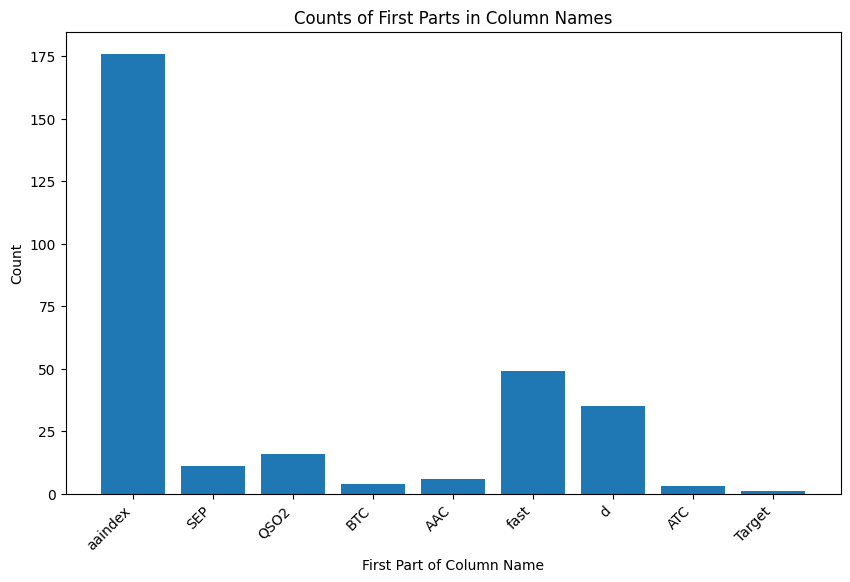

In [ ]:
import re
import matplotlib.pyplot as plt
column_counts = {}

for column in ftr:
    if "_" in column:
        first_part = column.split("_")[0]
    else:
        # Use regular expression to extract the first part before the number
        match = re.match(r'([a-zA-Z]+)([0-9]+)', column)
        if match:
            first_part = match.group(1)
        else:
            first_part = column  # If no underscore or number, use the whole column name

    if first_part in column_counts:
        column_counts[first_part] += 1
    else:
        column_counts[first_part] = 1

# Visualize the counts
plt.figure(figsize=(10, 6))
plt.bar(column_counts.keys(), column_counts.values())
plt.xlabel('First Part of Column Name')
plt.ylabel('Count')
plt.title('Counts of First Parts in Column Names')
plt.xticks(rotation=45, ha='right')
plt.show()

# probabilistic analysis

## AAC

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aac_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aac_all_test.csv")


In [ ]:
X_train_aac = train.drop('Target', axis=1)
y_train_aac = train['Target']

X_test_aac = test.drop('Target', axis=1)
y_test_aac = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
lgbm_probs = lgbm.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
xgb_probs = xgb.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
dt_probs = dt.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
lr_probs = lr.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
sv_probs = sv.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
mlp_probs = mlp.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
rf_probs = rf.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]
knn_probs = knn.fit(X_train_aac, y_train_aac).predict_proba(X_train_aac)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
meta_aac_train = pd.DataFrame({
    'EX_AAC': ex_probs,
    'LGBM-AAC': lgbm_probs,
    'XGB-AAC': xgb_probs,
    'DT-AAC': dt_probs,
    'LR-AAC': lr_probs,
    'SVC-AAC': sv_probs,
    'MLP-AAC': mlp_probs,
    'RF-AAC': rf_probs,
    'KNN-AAC': knn_probs,
    'Target': y_train_aac # Your target class (0 or 1)
})

meta_aac_train.to_csv('aac_train_proba.csv', index=False)

## aaindex


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aaindex_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ai_all_test.csv")
X_train_aai = train.drop('Target', axis=1)
y_train_aai = train['Target']

X_test_aai = test.drop('Target', axis=1)
y_test_aai = test['Target']

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
lgbm_probs = lgbm.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
xgb_probs = xgb.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
dt_probs = dt.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
lr_probs = lr.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
sv_probs = sv.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
mlp_probs = mlp.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
rf_probs = rf.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]
knn_probs = knn.fit(X_train_aai, y_train_aai).predict_proba(X_train_aai)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88564
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 553
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
meta_aai = pd.DataFrame({
    'EX_AAi': ex_probs,
    'LGBM-AAi': lgbm_probs,
    'XGB-AAi': xgb_probs,
    'DT-AAi': dt_probs,
    'LR-AAi': lr_probs,
    'SVC-AAi': sv_probs,
    'MLP-AAi': mlp_probs,
    'RF-AAi': rf_probs,
    'KNN-AAi': knn_probs,
    'Target': y_train_aai # Your target class (0 or 1)
})

meta_aai.to_csv('aai_train_proba.csv', index=False)

In [ ]:
meta_aai

## Atc and btc

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/abc_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/abc_all_test.csv")

In [ ]:
X_train_abc = train.drop('Target', axis=1)
y_train_abc = train['Target']

X_test_abc = test.drop('Target', axis=1)
y_test_abc = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
lgbm_probs = lgbm.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
xgb_probs = xgb.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
dt_probs = dt.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
lr_probs = lr.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
sv_probs = sv.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
mlp_probs = mlp.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
rf_probs = rf.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]
knn_probs = knn.fit(X_train_abc, y_train_abc).predict_proba(X_train_abc)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 895
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
meta_abc = pd.DataFrame({
    'EX_ABC': ex_probs,
    'LGBM-ABC': lgbm_probs,
    'XGB-ABC': xgb_probs,
    'DT-ABC': dt_probs,
    'LR-ABC': lr_probs,
    'SVC-ABC': sv_probs,
    'MLP-ABC': mlp_probs,
    'RF-ABC': rf_probs,
    'KNN-ABC': knn_probs,
    'Target': y_train_abc # Your target class (0 or 1)
})

meta_abc.to_csv('abc_train_proba.csv', index=False)

In [ ]:
meta_abc

## ctd


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ctd_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ctd_all_test.csv")

In [ ]:
X_train_ctd = train.drop('Target', axis=1)
y_train_ctd = train['Target']

X_test_ctd = test.drop('Target', axis=1)
y_test_ctd = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
lgbm_probs = lgbm.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
xgb_probs = xgb.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
dt_probs = dt.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
lr_probs = lr.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
sv_probs = sv.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
mlp_probs = mlp.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
rf_probs = rf.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]
knn_probs = knn.fit(X_train_ctd, y_train_ctd).predict_proba(X_train_ctd)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 60
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
meta_ctd = pd.DataFrame({
    'EX_ctd': ex_probs,
    'LGBM-ctd': lgbm_probs,
    'XGB-ctd': xgb_probs,
    'DT-ctd': dt_probs,
    'LR-ctd': lr_probs,
    'SVC-ctd': sv_probs,
    'MLP-ctd': mlp_probs,
    'RF-ctd': rf_probs,
    'KNN-ctd': knn_probs,
    'Target': y_train_ctd # Your target class (0 or 1)
})

meta_ctd.to_csv('ctd_train_proba.csv', index=False)

In [ ]:
meta_ctd

,EX_ctd,LGBM-ctd,XGB-ctd,DT-ctd,LR-ctd,SVC-ctd,MLP-ctd,RF-ctd,KNN-ctd,Target
0,1.000000,0.637599,0.938051,1.000000,0.994215,0.600929,1.000000,0.968089,1.0,1
1,1.000000,0.725302,0.826337,1.000000,0.806453,0.165524,0.998793,0.950000,1.0,1
2,0.000000,0.660306,0.263038,0.000000,0.610695,0.580165,0.125670,0.057571,0.2,1
3,1.000000,0.919858,0.985353,1.000000,0.906963,0.546325,0.994687,0.990000,0.8,1
4,0.000000,0.478898,0.114133,0.000000,0.387065,0.554120,0.022042,0.051415,0.4,1
...,...,...,...,...,...,...,...,...,...,...
123,0.000000,0.146630,0.004837,0.000000,0.079454,0.345815,0.000328,0.000000,0.0,0
124,0.143333,0.442570,0.078465,0.333333,0.426244,0.586758,0.012092,0.236045,0.0,0
125,0.500000,0.550037,0.705622,0.500000,0.475452,0.463423,0.577849,0.558487,0.6,0
126,0.470000,0.851664,0.925412,1.000000,0.821245,0.649663,0.776550,0.615556,0.6,0


## ctdc

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ctdc_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ctdc_all_test.csv")

In [ ]:
X_train_ctdc = train.drop('Target', axis=1)
y_train_ctdc = train['Target']

X_test_ctdc = test.drop('Target', axis=1)
y_test_ctdc = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
lgbm_probs = lgbm.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
xgb_probs = xgb.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
dt_probs = dt.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
lr_probs = lr.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
sv_probs = sv.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
mlp_probs = mlp.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
rf_probs = rf.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]
knn_probs = knn.fit(X_train_ctdc, y_train_ctdc).predict_proba(X_train_ctdc)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 973
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
meta_ctdc = pd.DataFrame({
    'EX_ctdc': ex_probs,
    'LGBM-ctdc': lgbm_probs,
    'XGB-ctdc': xgb_probs,
    'DT-ctdc': dt_probs,
    'LR-ctdc': lr_probs,
    'SVC-ctdc': sv_probs,
    'MLP-ctdc': mlp_probs,
    'RF-ctdc': rf_probs,
    'KNN-ctdc': knn_probs,
    'Target': y_train_ctdc # Your target class (0 or 1)
})

meta_ctdc.to_csv('ctdc_train_proba.csv', index=False)

In [ ]:
meta_ctdc

## dpc


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/dpc_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/dpc_all_test.csv")

In [ ]:
X_train_dpc = train.drop('Target', axis=1)
y_train_dpc = train['Target']

X_test_dpc = test.drop('Target', axis=1)
y_test_dpc = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
lgbm_probs = lgbm.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
xgb_probs = xgb.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
dt_probs = dt.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
lr_probs = lr.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
sv_probs = sv.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
mlp_probs = mlp.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
rf_probs = rf.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]
knn_probs = knn.fit(X_train_dpc, y_train_dpc).predict_proba(X_train_dpc)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
meta_dpc = pd.DataFrame({
    'EX_dpc': ex_probs,
    'LGBM-dpc': lgbm_probs,
    'XGB-dpc': xgb_probs,
    'DT-dpc': dt_probs,
    'LR-dpc': lr_probs,
    'SVC-dpc': sv_probs,
    'MLP-dpc': mlp_probs,
    'RF-dpc': rf_probs,
    'KNN-dpc': knn_probs,
    'Target': y_train_dpc # Your target class (0 or 1)
})

meta_dpc.to_csv('dpc_train_proba.csv', index=False)

In [ ]:
meta_dpc

## fastext


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/fst_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/fst_all_test.csv")

In [ ]:
X_train_fst = train.drop('Target', axis=1)
y_train_fst = train['Target']

X_test_fst = test.drop('Target', axis=1)
y_test_fst = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
lgbm_probs = lgbm.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
xgb_probs = xgb.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
dt_probs = dt.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
lr_probs = lr.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
sv_probs = sv.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
mlp_probs = mlp.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
rf_probs = rf.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]
knn_probs = knn.fit(X_train_fst, y_train_fst).predict_proba(X_train_fst)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43776
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 256
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [ ]:
meta_fst = pd.DataFrame({
    'EX_fst': ex_probs,
    'LGBM-fst': lgbm_probs,
    'XGB-fst': xgb_probs,
    'DT-fst': dt_probs,
    'LR-fst': lr_probs,
    'SVC-fst': sv_probs,
    'MLP-fst': mlp_probs,
    'RF-fst': rf_probs,
    'KNN-fst': knn_probs,
    'Target': y_train_fst # Your target class (0 or 1)
})

meta_fst.to_csv('fst_train_proba.csv', index=False)

In [ ]:
meta_fst

,EX_fst,LGBM-fst,XGB-fst,DT-fst,LR-fst,SVC-fst,MLP-fst,RF-fst,KNN-fst,Target
0,0.53,0.758997,0.799559,1.0,0.496111,0.534586,0.497258,0.50,0.8,1
1,0.84,0.939940,0.988557,1.0,0.496111,0.574845,0.497033,0.85,1.0,1
2,0.51,0.337475,0.667384,0.0,0.496117,0.571452,0.497108,0.51,0.8,1
3,0.53,0.568910,0.400729,1.0,0.496130,0.546471,0.497411,0.63,1.0,1
4,0.45,0.514034,0.591908,0.0,0.496139,0.675544,0.497075,0.56,0.6,1
...,...,...,...,...,...,...,...,...,...,...
123,0.52,0.508462,0.658602,0.0,0.496091,0.438715,0.496626,0.49,0.6,0
124,0.37,0.213115,0.116393,0.0,0.496055,0.376756,0.496231,0.38,0.4,0
125,0.47,0.316025,0.364436,0.0,0.496084,0.425688,0.496645,0.50,0.6,0
126,0.40,0.301659,0.424925,0.0,0.496094,0.529417,0.496623,0.47,0.8,0


## ngrams

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ngrams_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ng_all_test.csv")

In [ ]:
X_train_ng = train.drop('Target', axis=1)
y_train_ng = train['Target']

X_test_ng = test.drop('Target', axis=1)
y_test_ng = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
lgbm_probs = lgbm.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
xgb_probs = xgb.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
dt_probs = dt.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
lr_probs = lr.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
sv_probs = sv.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
mlp_probs = mlp.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
rf_probs = rf.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]
knn_probs = knn.fit(X_train_ng, y_train_ng).predict_proba(X_train_ng)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
meta_ng = pd.DataFrame({
    'EX_ng': ex_probs,
    'LGBM-ng': lgbm_probs,
    'XGB-ng': xgb_probs,
    'DT-ng': dt_probs,
    'LR-ng': lr_probs,
    'SVC-ng': sv_probs,
    'MLP-ng': mlp_probs,
    'RF-ng': rf_probs,
    'KNN-ng': knn_probs,
    'Target': y_train_ng # Your target class (0 or 1)
})

meta_ng.to_csv('ng_train_proba.csv', index=False)

In [ ]:
meta_ng

,EX_ng,LGBM-ng,XGB-ng,DT-ng,LR-ng,SVC-ng,MLP-ng,RF-ng,KNN-ng,Target
0,0.98,0.895908,0.964472,1.0,0.735158,0.788650,0.976042,0.97,1.0,1
1,0.99,0.939576,0.999130,1.0,0.579060,0.670963,0.922900,0.99,1.0,1
2,0.79,0.639657,0.954704,1.0,0.619856,0.708557,0.960109,0.73,0.8,1
3,0.99,0.930085,0.996228,1.0,0.753535,0.862790,0.996035,0.97,1.0,1
4,0.88,0.722809,0.920444,1.0,0.671510,0.835994,0.989147,0.83,1.0,1
...,...,...,...,...,...,...,...,...,...,...
123,0.11,0.443227,0.149904,0.0,0.324439,0.147348,0.001576,0.25,0.2,0
124,0.18,0.148786,0.010377,0.0,0.350261,0.299975,0.039543,0.14,0.6,0
125,0.57,0.449154,0.423388,1.0,0.427779,0.269559,0.880304,0.59,0.4,0
126,0.73,0.807415,0.929886,1.0,0.610479,0.709627,0.979840,0.80,0.8,0


## qso

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/qos_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/qos_all_test.csv")
X_train_qos = train.drop('Target', axis=1)
y_train_qos = train['Target']

X_test_qos = test.drop('Target', axis=1)
y_test_qos = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
lgbm_probs = lgbm.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
xgb_probs = xgb.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
dt_probs = dt.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
lr_probs = lr.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
sv_probs = sv.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
mlp_probs = mlp.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
rf_probs = rf.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]
knn_probs = knn.fit(X_train_qos, y_train_qos).predict_proba(X_train_qos)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1533
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
meta_qos = pd.DataFrame({
    'EX_qos': ex_probs,
    'LGBM-qos': lgbm_probs,
    'XGB-qos': xgb_probs,
    'DT-qos': dt_probs,
    'LR-qos': lr_probs,
    'SVC-qos': sv_probs,
    'MLP-qos': mlp_probs,
    'RF-qos': rf_probs,
    'KNN-qos': knn_probs,
    'Target': y_train_qos # Your target class (0 or 1)
})

meta_qos.to_csv('qos_train_proba.csv', index=False)

In [ ]:
meta_qos

,EX_qos,LGBM-qos,XGB-qos,DT-qos,LR-qos,SVC-qos,MLP-qos,RF-qos,KNN-qos,Target
0,0.97,0.973933,0.999136,1.0,0.899148,0.414060,0.999024,0.93,1.0,1
1,1.00,0.959359,0.998416,1.0,0.768176,0.352643,0.948264,0.96,1.0,1
2,0.66,0.821847,0.521703,1.0,0.684541,0.463202,0.742547,0.49,0.6,1
3,1.00,0.967989,0.997837,1.0,0.840290,0.500000,0.989048,0.96,1.0,1
4,0.93,0.638363,0.868977,1.0,0.595718,0.541421,0.864185,0.85,1.0,1
...,...,...,...,...,...,...,...,...,...,...
123,0.25,0.413067,0.656770,1.0,0.429304,0.500000,0.600433,0.34,0.6,0
124,0.07,0.127293,0.229465,0.0,0.198161,0.522727,0.002458,0.26,0.2,0
125,0.29,0.112670,0.015547,0.0,0.268762,0.506829,0.268775,0.13,0.6,0
126,0.59,0.761653,0.994711,0.0,0.700954,0.471315,0.725036,0.75,1.0,0


## sequence order

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sequenceorder_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sequence_order_all_test.csv")

In [ ]:
X_train_soc = train.drop('Target', axis=1)
y_train_soc = train['Target']

X_test_soc = test.drop('Target', axis=1)
y_test_soc = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
lgbm_probs = lgbm.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
xgb_probs = xgb.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
dt_probs = dt.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
lr_probs = lr.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
sv_probs = sv.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
mlp_probs = mlp.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
rf_probs = rf.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]
knn_probs = knn.fit(X_train_soc, y_train_soc).predict_proba(X_train_soc)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 333
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [ ]:
meta_soc = pd.DataFrame({
    'EX_soc': ex_probs,
    'LGBM-soc': lgbm_probs,
    'XGB-soc': xgb_probs,
    'DT-soc': dt_probs,
    'LR-soc': lr_probs,
    'SVC-soc': sv_probs,
    'MLP-soc': mlp_probs,
    'RF-soc': rf_probs,
    'KNN-soc': knn_probs,
    'Target': y_train_soc # Your target class (0 or 1)
})

meta_soc.to_csv('soc_train_proba.csv', index=False)

In [ ]:
meta_soc

,EX_soc,LGBM-soc,XGB-soc,DT-soc,LR-soc,SVC-soc,MLP-soc,RF-soc,KNN-soc,Target
0,0.59,0.473928,0.502680,0.0,0.497540,0.451305,0.926775,0.44,0.4,1
1,0.61,0.783579,0.742416,0.0,0.495487,0.470624,0.993412,0.56,0.4,1
2,0.13,0.572913,0.259370,0.0,0.496627,0.454565,0.975162,0.30,0.6,1
3,0.61,0.753004,0.902694,1.0,0.494452,0.489891,0.998079,0.64,0.4,1
4,0.16,0.354464,0.114344,0.0,0.494564,0.487726,0.997650,0.14,0.6,1
...,...,...,...,...,...,...,...,...,...,...
123,0.12,0.348947,0.070016,0.0,0.492384,0.527685,0.999847,0.24,0.2,0
124,0.14,0.143553,0.020423,0.0,0.491598,0.539905,0.999942,0.09,0.0,0
125,0.29,0.300746,0.310589,0.0,0.497274,0.450975,0.948001,0.19,0.6,0
126,0.35,0.508080,0.576762,0.0,0.497217,0.451058,0.950914,0.40,0.6,0


## shanosn physco


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sha_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sha_all_test.csv")

In [ ]:
X_train_sha = train.drop('Target', axis=1)
y_train_sha = train['Target']

X_test_sha = test.drop('Target', axis=1)
y_test_sha = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
lgbm_probs = lgbm.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
xgb_probs = xgb.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
dt_probs = dt.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
lr_probs = lr.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
sv_probs = sv.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
mlp_probs = mlp.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
rf_probs = rf.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]
knn_probs = knn.fit(X_train_sha, y_train_sha).predict_proba(X_train_sha)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 463
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
meta_sha = pd.DataFrame({
    'EX_sha': ex_probs,
    'LGBM-sha': lgbm_probs,
    'XGB-sha': xgb_probs,
    'DT-sha': dt_probs,
    'LR-sha': lr_probs,
    'SVC-sha': sv_probs,
    'MLP-sha': mlp_probs,
    'RF-sha': rf_probs,
    'KNN-sha': knn_probs,
    'Target': y_train_sha # Your target class (0 or 1)
})

meta_sha.to_csv('sha_train_proba.csv', index=False)

In [ ]:
meta_sha

## shanosn entropy


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/shonEntropy_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sha_en_all_test.csv")

In [ ]:
X_train_sen = train.drop('Target', axis=1)
y_train_sen = train['Target']

X_test_sen  = test.drop('Target', axis=1)
y_test_sen  = test['Target']


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
ex = ExtraTreesClassifier(n_estimators=100, criterion='gini', random_state=122)
lgbm  =LGBMClassifier(boosting_type='dart',n_estimators=100)
xgb = XGBClassifier()
dt = DecisionTreeClassifier(criterion= "gini", splitter= "best", random_state=132)
lr = LogisticRegression()
sv = SVC(kernel = "sigmoid",probability=True)
mlp = MLPClassifier(hidden_layer_sizes = 100, activation = "relu", solver= "adam", batch_size = "auto", learning_rate_init = 0.001, max_iter=200, shuffle= True, random_state=142)
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=102)
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the models and predict probabilities for the test set
ex_probs = ex.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
lgbm_probs = lgbm.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
xgb_probs = xgb.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
dt_probs = dt.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
lr_probs = lr.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
sv_probs = sv.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
mlp_probs = mlp.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
rf_probs = rf.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]
knn_probs = knn.fit(X_train_sen, y_train_sen).predict_proba(X_train_sen)[:, 1]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
s = ex.predict_proba(X_train_sen)[:, 1]


In [ ]:
meta_sen = pd.DataFrame({
    'EX_shEnt': ex_probs,
    'LGBM-shEnt': lgbm_probs,
    'XGB-shEnt': xgb_probs,
    'DT-shEnt': dt_probs,
    'LR-shEnt': lr_probs,
    'SVC-shEnt': sv_probs,
    'MLP-shEnt': mlp_probs,
    'RF-shEnt': rf_probs,
    'KNN-shEnt': knn_probs,
    'Target': y_train_sen # Your target class (0 or 1)
})

meta_sen.to_csv('sha_en_train_proba.csv', index=False)

In [ ]:
meta_sen

## proba feature selectn

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### test proba dataset

In [ ]:
aac = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/aac_proba.csv')
aai = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/aai_proba.csv')
abc = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/abc_proba.csv')
ctd = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/ctd_proba.csv')
ctdc = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/ctdc_proba.csv')
dpc = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/dpc_proba.csv')
fst = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/fst_proba.csv')
ng = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/ng_proba.csv')
qos = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/qos_proba.csv')
shaen = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/sha_en_proba.csv')
shan = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/sha_proba.csv')
soc = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/proba csv data/soc_proba.csv')

In [ ]:
aac1  = aac.drop('Target', axis=1)
aai1  = aai.drop('Target', axis=1)
abc1  = abc.drop('Target', axis=1)
ctd1  = ctd.drop('Target', axis=1)
ctdc1 = ctdc.drop('Target', axis=1)
dpc1  = dpc.drop('Target', axis=1)
fst1  = fst.drop('Target', axis=1)
ng1  = ng.drop('Target', axis=1)
qos1  = qos.drop('Target', axis=1)
shae1 = shaen.drop('Target', axis=1)
shan1 = shan.drop('Target', axis=1)
soc1  = soc.drop('Target', axis=1)

In [ ]:
test_data = pd.concat([aac1, aai1, abc1,ctd1, ctdc1, dpc1, fst1, ng1, qos1, shae1, shan1, soc1], axis=1)

In [ ]:
test_data['Target']=soc['Target']

In [ ]:
test_data.isnull().values.any()

False

### train proba datset

In [ ]:
aacT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/aac_train_proba.csv')
aaiT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/aai_train_proba.csv')
abcT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/abc_train_proba.csv')
ctdT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/ctd_train_proba.csv')
ctdcT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/ctdc_train_proba.csv')
dpcT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/dpc_train_proba.csv')
fstT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/fst_train_proba.csv')
ngT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/ng_train_proba.csv')
qosT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/qos_train_proba.csv')
shaenT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/sha_en_train_proba.csv')
shanT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/sha_train_proba.csv')
socT = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/train proba/soc_train_proba.csv')

In [ ]:
aactr  = aacT.drop('Target', axis=1)
aaitr  = aaiT.drop('Target', axis=1)
abctr  = abcT.drop('Target', axis=1)
ctdtr  = ctdT.drop('Target', axis=1)
ctdctr= ctdcT.drop('Target', axis=1)
dpctr  = dpcT.drop('Target', axis=1)
fsttr  = fstT.drop('Target', axis=1)
ngtr  = ngT.drop('Target', axis=1)
qostr  = qosT.drop('Target', axis=1)
shaetr = shaenT.drop('Target', axis=1)
shantr = shanT.drop('Target', axis=1)
soctr  = socT.drop('Target', axis=1)

In [ ]:
train_data = pd.concat([aactr, aaitr, abctr,ctdtr, ctdctr, dpctr, fsttr, ngtr, qostr, shaetr, shantr, soctr], axis=1)

In [ ]:
train_data['Target']=socT['Target']

In [ ]:
train_data

,EX_AAC,LGBM-AAC,XGB-AAC,DT-AAC,LR-AAC,SVC-AAC,MLP-AAC,RF-AAC,KNN-AAC,EX_AAi,...,EX_soc,LGBM-soc,XGB-soc,DT-soc,LR-soc,SVC-soc,MLP-soc,RF-soc,KNN-soc,Target
0,1.0,0.783993,0.969347,1.0,0.617826,0.466098,0.994818,0.970000,1.0,1.0,...,1.0,0.688133,0.882344,1.0,0.493246,0.520993,0.999551,0.93,0.6,1
1,1.0,0.965994,0.998935,1.0,0.688469,0.584364,0.955204,0.980000,1.0,1.0,...,1.0,0.802173,0.919406,1.0,0.494999,0.474841,0.996237,0.94,0.2,1
2,1.0,0.951596,0.989091,1.0,0.875180,0.598208,0.997831,1.000000,1.0,1.0,...,1.0,0.602672,0.644800,1.0,0.495095,0.472364,0.995648,0.81,0.4,1
3,1.0,0.321601,0.742657,1.0,0.516082,0.472352,0.886680,0.853333,0.6,1.0,...,1.0,0.603698,0.753016,1.0,0.493496,0.514602,0.999281,0.90,0.6,1
4,1.0,0.680992,0.917468,1.0,0.530398,0.455628,0.964338,0.823333,0.2,1.0,...,1.0,0.755283,0.979163,1.0,0.486493,0.625831,1.000000,0.95,0.8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,0.0,0.060147,0.018430,0.0,0.111972,0.500000,0.000130,0.025000,0.4,0.0,...,0.0,0.191322,0.072113,0.0,0.496316,0.445164,0.981853,0.11,0.4,0
508,0.0,0.115347,0.049063,0.0,0.207056,0.487717,0.004631,0.070000,0.2,0.0,...,0.0,0.319632,0.391747,0.0,0.495759,0.456275,0.990438,0.22,0.4,0
509,0.0,0.185118,0.035739,0.0,0.123148,0.464778,0.103448,0.050000,0.6,0.0,...,0.0,0.485829,0.289815,0.0,0.495096,0.472344,0.995877,0.21,0.4,0
510,0.0,0.401055,0.098600,0.0,0.330482,0.500000,0.020413,0.040000,0.2,0.0,...,0.0,0.248405,0.101026,0.0,0.497749,0.437541,0.911756,0.07,0.2,0


### RF-netBit custom full dtataset 99%




In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import ExtraTreesClassifier
import numpy as np
# Assume X_train, y_train, X_test, y_test are your training and testing data
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)


gb = GradientBoostingClassifier()
mlp= MLPClassifier(hidden_layer_sizes=60,random_state=10, max_iter=300,solver = 'lbfgs',activation = 'relu',n_iter_no_change=2)

# Fit base models
gb.fit(X_train, y_train)
mlp.fit(X_train, y_train)

# Generate predictions from base models
mlp_pred = mlp.predict(X_train)

gb_pred = gb.predict(X_train)

# Stack predictions along with original features
X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

# Standardize the stacked features
scaler = StandardScaler()
X_stacked = scaler.fit_transform(X_stacked)

# Meta model
meta_model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
    tf.keras.layers.Dense(400, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the meta model
meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2) #epoch 100 vlo for full dtaat

# Generate predictions on the test set
mlp_test_pred = mlp.predict(X_test)

gb_test_pred = gb.predict(X_test)


X_test_stacked = np.column_stack((X_test, mlp_test_pred,gb_test_pred ))
X_test_stacked = scaler.transform(X_test_stacked)

y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()

# Sensitivity (True Positive Rate or Recall)
sensitivity = tp / (tp + fn)

# Specificity (True Negative Rate)
specificity = tn / (tn + fp)
# Evaluate the performance of the stacking classifier
accuracy = accuracy_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
kappa = cohen_kappa_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Accuracy of Stacking Classifier: {accuracy_score(y_test, y_pred):.5f}")
print(f"Matthews Correlation Coefficient: {matthews_corrcoef(y_test, y_pred):.5f}")
print(f"Cohen's Kappa: {cohen_kappa_score(y_test, y_pred):.5f}")
print(f"F1 Score: {f1_score(y_test, y_pred):.5f}")

print(f"Sensitivity (True Positive Rate): {sensitivity:.5f}")
print(f"Specificity (True Negative Rate): {specificity:.5f}")


Epoch 1/200
13/13 [==============================] - 6s 62ms/step - loss: 0.8565 - accuracy: 0.5306 - val_loss: 0.8992 - val_accuracy: 0.0097
Epoch 2/200
13/13 [==============================] - 0s 18ms/step - loss: 0.7004 - accuracy: 0.5868 - val_loss: 0.7944 - val_accuracy: 0.0874
Epoch 3/200
13/13 [==============================] - 0s 18ms/step - loss: 0.6727 - accuracy: 0.6259 - val_loss: 0.7678 - val_accuracy: 0.1650
Epoch 4/200
13/13 [==============================] - 0s 18ms/step - loss: 0.6068 - accuracy: 0.6455 - val_loss: 0.8126 - val_accuracy: 0.0971
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5697 - accuracy: 0.7066 - val_loss: 0.7017 - val_accuracy: 0.6117
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5061 - accuracy: 0.7604 - val_loss: 0.6014 - val_accuracy: 0.7961
Epoch 7/200
13/13 [==============================] - 0s 19ms/step - loss: 0.3871 - accuracy: 0.8337 - val_loss: 0.3390 - val_accuracy: 0.9223
Epoch 

In [ ]:
import joblib


# Save the fitted model to a file
joblib.dump(meta_model, 'meta_model_rf99.21_rf_fina.joblib')

['meta_model_rf99.21_rf_fina.joblib']

### using CV

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import tensorflow as tf



# Fit base models
gb.fit(X_train, y_train)
mlp.fit(X_train, y_train)
knn.fit(X_train, y_train)
ex.fit(X_train, y_train)

# Generate predictions from base models
mlp_pred = mlp.predict(X_train)
knn_pred = knn.predict(X_train)
gb_pred = gb.predict(X_train)
ex_pred = ex.predict(X_train)

# Stack predictions along with original features
X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

# Standardize the stacked features
scaler = StandardScaler()
X_stacked = scaler.fit_transform(X_stacked)

# Meta model
meta_model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
    tf.keras.layers.Dense(400, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Use StratifiedKFold for cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # You can adjust the number of splits as needed
cv_scores = []

for train_index, val_index in cv.split(X_stacked, y_train):
    X_train_cv, X_val_cv = X_stacked[train_index], X_stacked[val_index]
    y_train_cv, y_val_cv = y_train[train_index], y_train[val_index]

    # Fit the meta model on the training fold
    meta_model.fit(X_train_cv, y_train_cv, epochs=200, batch_size=32, validation_data=(X_val_cv, y_val_cv), verbose=0)

    # Evaluate on the validation fold
    val_pred = (meta_model.predict(X_val_cv) > 0.5).astype(int)
    accuracy = accuracy_score(y_val_cv, val_pred)
    cv_scores.append(accuracy)

# Print the cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# Fit the meta model on the full training set
meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

# Generate predictions on the test set
mlp_test_pred = mlp.predict(X_test)
knn_test_pred = knn.predict(X_test)
gb_test_pred = gb.predict(X_test)
ex_test_pred = ex.predict(X_test)

X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
X_test_stacked = scaler.transform(X_test_stacked)

y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

# Evaluate the performance of the stacking classifier on the test set
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of Stacking Classifier on Test Set: {accuracy:.5f}")


4/4 [==============================] - 0s 3ms/step
Cross-Validation Scores: [0.9902912621359223, 1.0, 1.0, 1.0, 1.0]
Mean Accuracy: 0.9980582524271846
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 4.5808e-07 - accuracy: 1.0000 - val_loss: 1.2198e-16 - val_accuracy: 1.0000
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 3.0124e-08 - accuracy: 1.0000 - val_loss: 3.2221e-16 - val_accuracy: 1.0000
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 1.1663e-05 - accuracy: 1.0000 - val_loss: 4.0970e-16 - val_accuracy: 1.0000
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 3.4164e-08 - accuracy: 1.0000 - val_loss: 4.3479e-16 - val_accuracy: 1.0000
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 3.1047e-06 - accuracy: 1.0000 - val_loss: 4.1456e-16 - val_accuracy: 1.0000
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 2.9647e-07 - accuracy: 1.

In [ ]:
joblib.dump(meta_model, 'meta_model_cvgood.joblib')

['meta_model_cvgood.joblib']

In [ ]:
loaded_model = joblib.load('/content/meta_model_cvgood.joblib')
mlp_test_pred = mlp.predict(X_test)
knn_test_pred = knn.predict(X_test)
gb_test_pred = gb.predict(X_test)
ex_test_pred = ex.predict(X_test)

X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
X_test_stacked = scaler.transform(X_test_stacked)

y_pred = (loaded_model.predict(X_test_stacked) > 0.5).astype(int)

# Evaluate the performance of the stacking classifier on the test set
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of Stacking Classifier on Test Set: {accuracy:.5f}")


4/4 [==============================] - 0s 6ms/step
Accuracy of Stacking Classifier on Test Set: 0.97656


In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score, log_loss, accuracy_score, matthews_corrcoef, roc_auc_score, cohen_kappa_score
Accuracy = accuracy_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
kappa = cohen_kappa_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
precision_score = precision_score(y_test, y_pred)
recall_score = recall_score(y_test, y_pred)

In [ ]:
recall_score

0.8387096774193549

### Pipeline wise

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# Assuming you have your training and testing datasets loaded as X_train, y_train, X_test, y_test

# Create a 5-fold stratified cross-validation
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define models
lr_model = LogisticRegression(random_state=42)
mlp_model = MLPClassifier(random_state=42)
lgbm_model = LGBMClassifier(random_state=42)
knn_model = KNeighborsClassifier()
et_model = ExtraTreesClassifier(random_state=42)

# Create a pipeline for each model
lr_pipeline = Pipeline([('scaler', StandardScaler()), ('lr', lr_model)])
mlp_pipeline = Pipeline([('scaler', StandardScaler()), ('mlp', mlp_model)])
lgbm_pipeline = Pipeline([('lgbm', lgbm_model)])
knn_pipeline = Pipeline([('scaler', StandardScaler()), ('knn', knn_model)])
et_pipeline = Pipeline([('et', et_model)])

# Create a list of models and pipelines
models = [lr_pipeline, mlp_pipeline, lgbm_pipeline, knn_pipeline, et_pipeline]
model_names = ['LR', 'MLP', 'LGBM', 'KNN', 'ExtraTree']

# Initialize an array to store the final predictions
final_predictions = np.zeros((X_test.shape[0], len(models)))

# Perform cross-validation and make predictions for each model
for i, model in enumerate(models):
    print(f"Training and validating {model_names[i]}...")
    y_pred = cross_val_predict(model, X_train, y_train, cv=skf, method='predict_proba', n_jobs=-1)
    final_predictions[:, i] = y_pred[:, 1]  # Assuming binary classification

# Take the mean of predictions across models
final_predictions_mean = np.mean(final_predictions, axis=1)

# Convert probabilities to binary predictions (you can adjust the threshold)
threshold = 0.5
final_predictions_binary = (final_predictions_mean > threshold).astype(int)

# Evaluate the final predictions on the test set
accuracy = accuracy_score(y_test, final_predictions_binary)
print(f"Final Accuracy on Test Set: {accuracy}")


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn .ensemble import RandomForestClassifier
from sklearn .ensemble import VotingClassifier , BaggingClassifier , StackingClassifier
from sklearn.model_selection import LeaveOneOut,cross_val_score
loo=LeaveOneOut()
dt = DecisionTreeClassifier(random_state=142)

bagging = BaggingClassifier(
    estimator = LogisticRegression(),
    n_estimators = 10
)
mlp= MLPClassifier(hidden_layer_sizes=100,random_state=142, max_iter=300,solver = 'lbfgs',activation = 'relu',learning_rate=0.01)
knn=KNeighborsClassifier(n_neighbors=10)
ex = ExtraTreesClassifier(n_estimators=100, criterion='log_loss',random_state=135)
base_models = [('ex',ex),('dt',dt),('bagging ',bagging) , ('KNN',knn)]

stacking = StackingClassifier(
    estimators = base_models ,
    final_estimator = LogisticRegression(penalty='l2'),
    cv = loo
)

stacking.fit(X_train , y_train)

StackingClassifier(cv=LeaveOneOut(),
                   estimators=[('ex',
                                ExtraTreesClassifier(criterion='log_loss',
                                                     random_state=135)),
                               ('dt', DecisionTreeClassifier(random_state=142)),
                               ('bagging ',
                                BaggingClassifier(estimator=LogisticRegression())),
                               ('KNN', KNeighborsClassifier(n_neighbors=10))],
                   final_estimator=LogisticRegression())

In [ ]:
y_pred = stacking.predict(X_test)
accuracy_score(y_test,y_pred)

0.9375

### lazzy clasify

In [ ]:
!python -m pip install --upgrade pip

###


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 12.7 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


In [ ]:
pip install lazypredict

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)

# Print the models and their accuracy scores
print(models)



 97%|█████████▋| 28/29 [00:23<00:02,  2.10s/it]

[LightGBM] [Info] Number of positive: 256, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 158730
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 1032
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

100%|██████████| 29/29 [00:35<00:00,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RidgeClassifierCV                  1.00               1.00     1.00      1.00   
LinearDiscriminantAnalysis         0.99               0.99     0.99      0.99   
RidgeClassifier                    0.99               0.99     0.99      0.99   
LinearSVC                          0.97               0.97     0.97      0.97   
CalibratedClassifierCV             0.97               0.97     0.97      0.97   
PassiveAggressiveClassifier        0.97               0.97     0.97      0.97   
LogisticRegression                 0.97               0.97     0.97      0.97   
ExtraTreesClassifier               0.95               0.95     0.95      0.95   
SGDClassifier                      0.95 

In [ ]:

# from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
# from sklearn.linear_model import LogisticRegression
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.ensemble import ExtraTreesClassifier
# from sklearn.ensemble import StackingClassifier
# from xgboost import XGBClassifier
# #STACKING

# rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
# ada=AdaBoostClassifier()

# ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

# stk3 = StackingClassifier(estimators=[('xgb',rf),('knn', knn)], final_estimator=LogisticRegression())




# total_Metics = []
# total_Metics = pd.DataFrame(total_Metics)
# total_Metics['Classifier'] = 'Classifier'
# total_Metics['Accuracy'] = 'Accuracy'
# total_Metics['mcc'] = 'mcc'
# # total_Metics['auc'] = 'auc'
# total_Metics['Kappa'] = 'Kappa'
# total_Metics['f1'] = 'f1'
# total_Metics['sensitivity'] = 'sensitivity'
# total_Metics['Specificity'] = 'Specificity'


# model_list = [rf,ada,ex,stk3]

# for model in model_list:
#   from sklearn.metrics import f1_score, precision_score, recall_score, log_loss, accuracy_score, matthews_corrcoef, roc_auc_score, cohen_kappa_score

#   model.fit(X_train, y_train)
#   ypred = model.predict(X_test)

#   #cm1 = confusion_matrix(y, ypred)
#   # report performance
#   Accuracy = accuracy_score(y_test, ypred)
#   mcc = matthews_corrcoef(y_test, ypred)

#   kappa = cohen_kappa_score(y_test, ypred)
#   f1 = f1_score(y_test, ypred)


#   cm = confusion_matrix(y_test, ypred)
#   tn, fp, fn, tp = cm.ravel()

#   sensitivity = tp / (tp + fn)
#   specificity = tn / (tn + fp)


#   total_Metics.loc[len(total_Metics.index)] = [model,Accuracy, mcc, kappa, f1, sensitivity, specificity]


# # Display the results
# print(total_Metics)

                                          Classifier  Accuracy       mcc  \
0  (DecisionTreeClassifier(criterion='entropy', m...  0.867188  0.761739   
1  (DecisionTreeClassifier(max_depth=1, random_st...  0.914062  0.840635   
2  (ExtraTreeClassifier(random_state=1165313289),...  0.976562  0.953241   
3  StackingClassifier(estimators=[('xgb',\n      ...  0.929688  0.868000   

      Kappa        f1  sensitivity  Specificity  
0  0.734375  0.846847     0.734375     1.000000  
1  0.828125  0.905983     0.828125     1.000000  
2  0.953125  0.976378     0.968750     0.984375  
3  0.859375  0.924370     0.859375     1.000000  


### roc curve

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
import numpy as np
import tensorflow as tf

# Assuming classifiers and classifier_labels are already defined as in your question

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
dt=DecisionTreeClassifier(random_state=10)
rf= RandomForestClassifier(n_estimators=100,criterion='entropy')
ada=AdaBoostClassifier(n_estimators=200, random_state=10,learning_rate=1)
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)
# Assuming X_test and y_test are your test data

classifiers = [dt, rf,  ex,ada, meta_model]
classifier_labels = ['DT', 'RF', 'EX', 'ADA', 'Meta Model']

dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
ada.fit(X_train, y_train)
ex.fit(X_train, y_train)

# Initialize the figure
plt.figure(figsize=(10, 8))
# Plot ROC curve for each classifier
for clf, label in zip(classifiers, classifier_labels):
    if label == 'Meta Model':
        y_pred = meta_model.predict(X_stacked).ravel()
    else:
        y_pred = clf.predict_proba(X_train)[:, 1]

    fpr, tpr, _ = roc_curve(y_train, y_pred)
    roc_auc = auc(fpr, tpr)

    # Plot the ROC curve
    plt.plot(fpr, tpr, label=f'{label} (AUC = {roc_auc:.2f})')

# Plot the random classifier for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random', alpha=0.5)

# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# lazzyporedict on individual extractor based on 22 distinct model

## aac individual

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aac_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aac_all_test.csv")
X_train_aac = train.drop('Target', axis=1)
y_train_aac = train['Target']

X_test_aac = test.drop('Target', axis=1)
y_test_aac = test['Target']

### lazzy clasify

In [ ]:
!python -m pip install --upgrade pip


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 7.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


In [ ]:
pip install lazypredict

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:45<00:03,  3.58s/it]

[LightGBM] [Info] Number of positive: 256, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 158730
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 1032
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

100%|██████████| 29/29 [01:00<00:00,  2.09s/it]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RidgeClassifierCV                  1.00               1.00     1.00      1.00   
LinearDiscriminantAnalysis         0.99               0.99     0.99      0.99   
RidgeClassifier                    0.99               0.99     0.99      0.99   
LinearSVC                          0.97               0.97     0.97      0.97   
CalibratedClassifierCV             0.97               0.97     0.97      0.97   
PassiveAggressiveClassifier        0.97               0.97     0.97      0.97   
LogisticRegression                 0.97               0.97     0.97      0.97   
ExtraTreesClassifier               0.95               0.95     0.95      0.95   
SGDClassifier                      0.95               0.95     0.95      0.95   
NuSVC                              0.93               0.93     0.93      0.93   
AdaBoostClassifier          

## aaindex

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aaindex_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ai_all_test.csv")
X_train = train.drop('Target', axis=1)
y_train = train['Target']

X_test = test.drop('Target', axis=1)
y_test = test['Target']

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:27<00:02,  2.08s/it]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87526
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 553
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

100%|██████████| 29/29 [00:37<00:00,  1.30s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
LinearDiscriminantAnalysis         0.98               0.98     0.98      0.98   
RidgeClassifierCV                  0.98               0.98     0.98      0.98   
RidgeClassifier                    0.98               0.98     0.98      0.98   
LinearSVC                          0.98               0.98     0.98      0.98   
SVC                                0.97               0.97     0.97      0.97   
CalibratedClassifierCV             0.95               0.95     0.95      0.95   
LGBMClassifier                     0.94               0.94     0.94      0.94   
XGBClassifier                      0.92               0.92     0.92      0.92   
RandomForestClassifier             0.91               0.91     0.91      0.91   
ExtraTreesClassifier              

## QSO

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/qos_all_train.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/qos_all_test.csv")
X_train = train.drop('Target', axis=1)
y_train = train['Target']

X_test = test.drop('Target', axis=1)
y_test = test['Target']


In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:09<00:01,  1.05s/it]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1571
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

100%|██████████| 29/29 [00:09<00:00,  2.95it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model             

## ABC

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/abc_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/abc_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

100%|██████████| 29/29 [00:04<00:00,  6.77it/s]


[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 829
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

## FASTEXT

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/fst_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/fst_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:22<00:02,  2.94s/it]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43776
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 256
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

100%|██████████| 29/29 [00:24<00:00,  1.20it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
NuSVC                              0.77               0.77     0.77      0.76   
SVC                                0.74               0.75     0.75      0.74   
NearestCentroid                    0.72               0.72     0.72      0.72   
ExtraTreesClassifier               0.70               0.70     0.70      0.70   
CalibratedClassifierCV             0.68               0.68     0.68      0.68   
RidgeClassifierCV                  0.68               0.68     0.68      0.68   
LogisticRegression                 0.67               0.67     0.67      0.67   
XGBClassifier                      0.67       

## shannon_en

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/shonEntropy_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sha_en_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

100%|██████████| 29/29 [00:02<00:00, 10.30it/s]

[LightGBM] [Info] Number of positive: 254, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496094 -> initscore=-0.015625
[LightGBM] [Info] Start training from score -0.015625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

## doc2vec

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:

columns_to_extract = ['d2v0', 'd2v1', 'd2v2', 'd2v3', 'd2v4', 'd2v5', 'd2v6', 'd2v7', 'd2v8', 'd2v9',
                      'd2v10', 'd2v11', 'd2v12', 'd2v13', 'd2v14', 'd2v15', 'd2v16', 'd2v17', 'd2v18',
                      'd2v19', 'd2v20', 'd2v21', 'd2v22', 'd2v23', 'd2v24', 'd2v25', 'd2v26', 'd2v27',
                      'd2v28', 'd2v29', 'd2v30', 'd2v31', 'd2v32', 'd2v33', 'd2v34', 'd2v35', 'd2v36',
                      'd2v37', 'd2v38', 'd2v39', 'd2v40', 'd2v41', 'd2v42', 'd2v43', 'd2v44', 'd2v45',
                      'd2v46', 'd2v47', 'd2v48', 'd2v49', 'd2v50', 'd2v51', 'd2v52', 'd2v53', 'd2v54',
                      'd2v55', 'd2v56', 'd2v57', 'd2v58', 'd2v59', 'd2v60', 'd2v61', 'd2v62', 'd2v63',
                      'd2v64', 'd2v65', 'd2v66', 'd2v67', 'd2v68', 'd2v69', 'd2v70', 'd2v71', 'd2v72',
                      'd2v73', 'd2v74', 'd2v75', 'd2v76', 'd2v77', 'd2v78', 'd2v79', 'd2v80', 'd2v81',
                      'd2v82', 'd2v83', 'd2v84', 'd2v85', 'd2v86', 'd2v87', 'd2v88', 'd2v89', 'd2v90',
                      'd2v91', 'd2v92', 'd2v93', 'd2v94', 'd2v95', 'd2v96', 'd2v97', 'd2v98', 'd2v99',
                      'd2v100', 'd2v101', 'd2v102', 'd2v103', 'd2v104', 'd2v105', 'd2v106', 'd2v107',
                      'd2v108', 'd2v109', 'd2v110', 'd2v111', 'd2v112', 'd2v113', 'd2v114', 'd2v115',
                      'd2v116', 'd2v117', 'd2v118', 'd2v119', 'd2v120', 'd2v121', 'd2v122', 'd2v123',
                      'd2v124', 'd2v125', 'd2v126', 'd2v127','Target']

traindoc = train[columns_to_extract]
testndoc = test[columns_to_extract]



In [ ]:
X_train = traindoc.drop("Target", axis=1)
y_train = traindoc['Target']

X_test = testndoc.drop("Target", axis=1)
y_test = testndoc['Target']

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:18<00:02,  2.12s/it]

[LightGBM] [Info] Number of positive: 256, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21888
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 128
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

100%|██████████| 29/29 [00:20<00:00,  1.44it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
XGBClassifier                      0.55               0.55     0.55      0.55   
KNeighborsClassifier               0.55               0.55     0.55      0.55   
ExtraTreeClassifier                0.53               0.53     0.53      0.53   
ExtraTreesClassifier               0.53               0.53     0.53      0.53   
BernoulliNB                        0.52               0.52     0.52      0.52   
PassiveAggressiveClassifier        0.52               0.52     0.52      0.52   
CalibratedClassifierCV             0.51               0.51     0.51      0.50   
DummyClassifier                    0.50               0.50     0.50      0.33   
LabelPropagation                   0.50 

# **proposed model hyperparameter observation**

Epoch 1/200
13/13 [==============================] - 4s 108ms/step - loss: 1.0060 - accuracy: 0.5403 - val_loss: 1.1996 - val_accuracy: 0.0097
Epoch 2/200
13/13 [==============================] - 0s 25ms/step - loss: 0.9023 - accuracy: 0.5844 - val_loss: 0.8920 - val_accuracy: 0.0291
Epoch 3/200
13/13 [==============================] - 0s 26ms/step - loss: 0.8151 - accuracy: 0.5599 - val_loss: 0.8487 - val_accuracy: 0.0485
Epoch 4/200
13/13 [==============================] - 0s 22ms/step - loss: 0.7557 - accuracy: 0.6406 - val_loss: 0.8581 - val_accuracy: 0.0485
Epoch 5/200
13/13 [==============================] - 0s 28ms/step - loss: 0.7205 - accuracy: 0.6210 - val_loss: 0.8027 - val_accuracy: 0.1748
Epoch 6/200
13/13 [==============================] - 0s 33ms/step - loss: 0.6573 - accuracy: 0.6333 - val_loss: 0.7079 - val_accuracy: 0.5437
Epoch 7/200
13/13 [==============================] - 1s 51ms/step - loss: 0.6648 - accuracy: 0.6455 - val_loss: 0.6596 - val_accuracy: 0.6990
Epoch

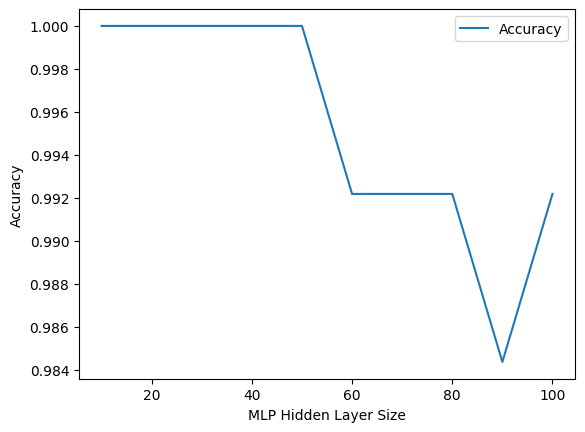

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.utils import shuffle

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test, mlp_hidden_size):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=(mlp_hidden_size,), random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_test, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier for different MLP hidden layer sizes and store metrics
hidden_layer_sizes = range(10, 101, 10)
for hidden_size in hidden_layer_sizes:
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test, hidden_size)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list, index=hidden_layer_sizes)

# Display the results
print(results_df)

# Find the hidden layer size with the highest accuracy
best_hidden_size = results_df['Accuracy'].idxmax()
print(f"Best MLP Hidden Layer Size: {best_hidden_size}")

# Plot the results if needed
import matplotlib.pyplot as plt

plt.plot(hidden_layer_sizes, results_df['Accuracy'], label='Accuracy')
plt.xlabel('MLP Hidden Layer Size')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


# **number of features observation for Random Forest**

### RF 100 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(100)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

on test

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 20ms/step - loss: 4.4338e-05 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 18ms/step - loss: 2.0602e-04 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0038 - accuracy: 0.9976 - val_loss: 4.0950e-04 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 14ms/step - loss: 1.6436e-04 - accuracy: 1.0000 - val_loss: 2.0884e-04 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 15ms/step - loss: 1.4589e-04 - accuracy: 1.0000 - val_loss: 1.7379e-04 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0046 - accuracy: 0.9976 - val_loss: 5.0098e-04 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 15ms/step

on train

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train are your training data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the training set
    mlp_train_pred = mlp.predict(X_train)
    gb_train_pred = gb.predict(X_train)

    X_train_stacked = np.column_stack((X_train, mlp_train_pred, gb_train_pred))
    X_train_stacked = scaler.transform(X_train_stacked)

    y_pred = (meta_model.predict(X_train_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_train, y_pred)
    mcc = matthews_corrcoef(y_train, y_pred)
    kappa = cohen_kappa_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    recall = recall_score(y_train, y_pred)
    cm = confusion_matrix(y_train, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_train, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier 50 times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0658 - val_accuracy: 0.9903
Epoch 113/200
13/13 [==============================] - 0s 11ms/step - loss: 3.3432e-05 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 11ms/step - loss: 5.5652e-05 - accuracy: 1.0000 - val_loss: 5.9382e-04 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 12ms/step - loss: 7.2713e-04 - accuracy: 1.0000 - val_loss: 2.2834e-04 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 12ms/step - loss: 2.8737e-04 - accuracy: 1.0000 - val_loss: 7.0372e-05 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 12ms/step - loss: 3.9626e-04 - accuracy: 1.0000 - val_loss: 5.3065e-05 - val_accuracy: 1.0000
Epoch 118/200
13/13 [============================

### RF 150 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(150)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

on test

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 14ms/step - loss: 0.0175 - accuracy: 0.9976 - val_loss: 0.0515 - val_accuracy: 0.9903
Epoch 112/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0077 - accuracy: 0.9976 - val_loss: 1.3517e-06 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 14ms/step - loss: 1.2546e-04 - accuracy: 1.0000 - val_loss: 9.2661e-07 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 14ms/step - loss: 6.2872e-04 - accuracy: 1.0000 - val_loss: 2.8999e-06 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 6.3410e-06 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0193 - accuracy: 0.9951 - val_loss: 8.4958e-07 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 13ms/step - l

on train

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train are your training data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the training set
    mlp_train_pred = mlp.predict(X_train)
    gb_train_pred = gb.predict(X_train)

    X_train_stacked = np.column_stack((X_train, mlp_train_pred, gb_train_pred))
    X_train_stacked = scaler.transform(X_train_stacked)

    y_pred = (meta_model.predict(X_train_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_train, y_pred)
    mcc = matthews_corrcoef(y_train, y_pred)
    kappa = cohen_kappa_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    recall = recall_score(y_train, y_pred)
    cm = confusion_matrix(y_train, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_train, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier 50 times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 17ms/step - loss: 2.3000e-04 - accuracy: 1.0000 - val_loss: 6.3781e-06 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0072 - accuracy: 0.9951 - val_loss: 8.7184e-08 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.7293e-08 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 18ms/step - loss: 1.1009e-04 - accuracy: 1.0000 - val_loss: 1.1439e-08 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 16ms/step - loss: 1.8361e-04 - accuracy: 1.0000 - val_loss: 9.1604e-09 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 18ms/step - loss: 1.5260e-04 - accuracy: 1.0000 - val_loss: 8.4467e-09 - val_accuracy: 1.0000
Epoch 118/200
13/13 [========================

### RF 200 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(200)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

on test

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 19ms/step - loss: 7.5616e-04 - accuracy: 1.0000 - val_loss: 3.2449e-07 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 15ms/step - loss: 2.3908e-04 - accuracy: 1.0000 - val_loss: 4.7675e-07 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 17ms/step - loss: 4.7650e-05 - accuracy: 1.0000 - val_loss: 5.4320e-07 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 18ms/step - loss: 8.9829e-04 - accuracy: 1.0000 - val_loss: 0.0666 - val_accuracy: 0.9903
Epoch 116/200
13/13 [==============================] - 0s 16ms/step - loss: 2.5824e-05 - accuracy: 1.0000 - val_loss: 0.1064 - val_accuracy: 0.9903
Epoch 117/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0043 - accuracy: 0.9976 - val_loss: 1.8735e-07 - val_accuracy: 1.0000
Epoch 118/200
13/13 [============================

on train

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train are your training data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the training set
    mlp_train_pred = mlp.predict(X_train)
    gb_train_pred = gb.predict(X_train)

    X_train_stacked = np.column_stack((X_train, mlp_train_pred, gb_train_pred))
    X_train_stacked = scaler.transform(X_train_stacked)

    y_pred = (meta_model.predict(X_train_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_train, y_pred)
    mcc = matthews_corrcoef(y_train, y_pred)
    kappa = cohen_kappa_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    recall = recall_score(y_train, y_pred)
    cm = confusion_matrix(y_train, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_train, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier 50 times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 24ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.2090 - val_accuracy: 0.9612
Epoch 113/200
13/13 [==============================] - 0s 24ms/step - loss: 0.0125 - accuracy: 0.9976 - val_loss: 0.1385 - val_accuracy: 0.9612
Epoch 114/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0175 - accuracy: 0.9927 - val_loss: 0.0927 - val_accuracy: 0.9806
Epoch 115/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0050 - accuracy: 0.9976 - val_loss: 0.1575 - val_accuracy: 0.9709
Epoch 116/200
13/13 [==============================] - 0s 21ms/step - loss: 0.0152 - accuracy: 0.9951 - val_loss: 0.2698 - val_accuracy: 0.9417
Epoch 117/200
13/13 [==============================] - 0s 24ms/step - loss: 0.0225 - accuracy: 0.9878 - val_loss: 0.3610 - val_accuracy: 0.9612
Epoch 118/200
13/13 [==============================] - 0s 22ms/step - loss: 0.0012 - 

### RF 250 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(250)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

on test

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 10ms/step - loss: 0.0036 - accuracy: 0.9976 - val_loss: 2.7507e-06 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 12ms/step - loss: 6.1082e-04 - accuracy: 1.0000 - val_loss: 1.1591e-06 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 9ms/step - loss: 3.6912e-04 - accuracy: 1.0000 - val_loss: 9.1773e-07 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 10ms/step - loss: 5.8079e-04 - accuracy: 1.0000 - val_loss: 8.3158e-07 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 8.5401e-07 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 10ms/step - loss: 7.1467e-04 - accuracy: 1.0000 - val_loss: 1.0312e-06 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 9ms

on train

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train are your training data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the training set
    mlp_train_pred = mlp.predict(X_train)
    gb_train_pred = gb.predict(X_train)

    X_train_stacked = np.column_stack((X_train, mlp_train_pred, gb_train_pred))
    X_train_stacked = scaler.transform(X_train_stacked)

    y_pred = (meta_model.predict(X_train_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_train, y_pred)
    mcc = matthews_corrcoef(y_train, y_pred)
    kappa = cohen_kappa_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    recall = recall_score(y_train, y_pred)
    cm = confusion_matrix(y_train, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_train, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier 50 times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 1.2132e-08 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0051 - accuracy: 0.9976 - val_loss: 7.0342e-07 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 10ms/step - loss: 8.3141e-04 - accuracy: 1.0000 - val_loss: 2.4872e-05 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 6.4930e-05 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 11ms/step - loss: 5.8789e-04 - accuracy: 1.0000 - val_loss: 6.1530e-05 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 11ms/step - loss: 8.3353e-04 - accuracy: 1.0000 - val_loss: 5.1364e-05 - val_accuracy: 1.0000
Epoch 118/200
13/13 [============================

### RF 300 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(300)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]

In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

### on test dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


### **overfitting visualize**

Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 16ms/step - loss: 0.0084 - accuracy: 0.9976 - val_loss: 0.0073 - val_accuracy: 0.9903
Epoch 115/200
13/13 [==============================] - 0s 18ms/step - loss: 5.2221e-04 - accuracy: 1.0000 - val_loss: 0.0098 - val_accuracy: 0.9903
Epoch 116/200
13/13 [==============================] - 0s 17ms/step - loss: 2.3058e-04 - accuracy: 1.0000 - val_loss: 0.0096 - val_accuracy: 0.9903
Epoch 117/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0314 - accuracy: 0.9976 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0040 - accuracy: 0.9976 - val_loss: 0.0138 - val_accuracy: 0.9903
Epoch 119/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0202 - accuracy: 0.9976 - val_loss: 0.0130 - val_accuracy: 0.9903
Epoch 120/200
13/13 [==============================] - 0s 19ms/step - loss: 3.4154e-04 - ac

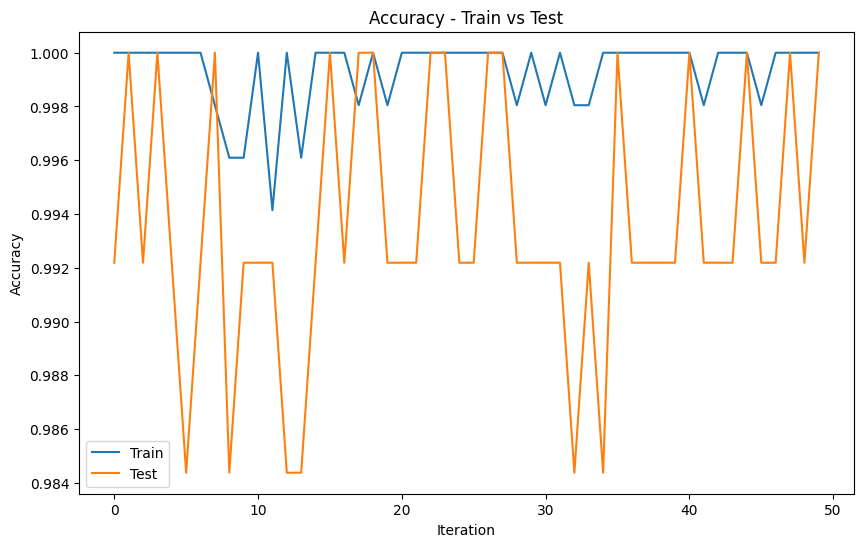

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked_train = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked_train = scaler.fit_transform(X_stacked_train)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked_train.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked_train, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_stacked_test = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_stacked_test = scaler.transform(X_stacked_test)

    y_train_pred = (meta_model.predict(X_stacked_train) > 0.5).astype(int)
    y_test_pred = (meta_model.predict(X_stacked_test) > 0.5).astype(int)

    # Calculate accuracy for train and test sets
    accuracy_train = accuracy_score(y_train, y_train_pred)
    accuracy_test = accuracy_score(y_test, y_test_pred)

    return {'Accuracy_train': accuracy_train, 'Accuracy_test': accuracy_test}


# Initialize lists to store results
results_list = []

# Run the stacking classifier fifty times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Plot overlap of train and test accuracy values in one diagram
plt.figure(figsize=(10, 6))
plt.plot(results_df['Accuracy_train'], label='Train')
plt.plot(results_df['Accuracy_test'], label='Test')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Accuracy - Train vs Test')
plt.legend()
plt.show()


### cv test

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd

# Replace these with your actual training and testing data
# X_train, y_train, X_test, y_test = ...

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    # knn = KNeighborsClassifier(n_neighbors=10)
    # ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv_results.csv', index=True)
print(summary_df)



Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 21ms/step - loss: 7.0198e-05 - accuracy: 1.0000 - val_loss: 4.8427e-06 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 21ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.7618e-06 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 18ms/step - loss: 4.2410e-04 - accuracy: 1.0000 - val_loss: 2.8869e-06 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0042 - accuracy: 0.9975 - val_loss: 0.2451 - val_accuracy: 0.9703
Epoch 116/200
13/13 [==============================] - 0s 25ms/step - loss: 0.0077 - accuracy: 0.9950 - val_loss: 0.1360 - val_accuracy: 0.9802
Epoch 117/200
13/13 [==============================] - 0s 21ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.4078e-04 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 19m

### on train dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train are your training data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the training set
    mlp_train_pred = mlp.predict(X_train)
    gb_train_pred = gb.predict(X_train)

    X_train_stacked = np.column_stack((X_train, mlp_train_pred, gb_train_pred))
    X_train_stacked = scaler.transform(X_train_stacked)

    y_pred = (meta_model.predict(X_train_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_train, y_pred)
    mcc = matthews_corrcoef(y_train, y_pred)
    kappa = cohen_kappa_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    recall = recall_score(y_train, y_pred)
    cm = confusion_matrix(y_train, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_train, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier 50 times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 19ms/step - loss: 6.5347e-04 - accuracy: 1.0000 - val_loss: 0.0480 - val_accuracy: 0.9903
Epoch 113/200
13/13 [==============================] - 0s 18ms/step - loss: 2.7556e-04 - accuracy: 1.0000 - val_loss: 0.0418 - val_accuracy: 0.9903
Epoch 114/200
13/13 [==============================] - 0s 18ms/step - loss: 2.9114e-04 - accuracy: 1.0000 - val_loss: 0.0420 - val_accuracy: 0.9903
Epoch 115/200
13/13 [==============================] - 0s 17ms/step - loss: 2.0257e-04 - accuracy: 1.0000 - val_loss: 0.0417 - val_accuracy: 0.9903
Epoch 116/200
13/13 [==============================] - 0s 20ms/step - loss: 2.0189e-04 - accuracy: 1.0000 - val_loss: 0.0406 - val_accuracy: 0.9903
Epoch 117/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0319 - val_accuracy: 0.9903
Epoch 118/200
13/13 [==============================] - 0s 18ms/st

### RF 350 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(350)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

on test dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 21ms/step - loss: 1.9267e-04 - accuracy: 1.0000 - val_loss: 4.3041e-05 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 19ms/step - loss: 2.7372e-04 - accuracy: 1.0000 - val_loss: 4.4813e-05 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 20ms/step - loss: 2.4416e-04 - accuracy: 1.0000 - val_loss: 3.1460e-05 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 16ms/step - loss: 4.6848e-04 - accuracy: 1.0000 - val_loss: 3.0275e-05 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.5856e-05 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 15ms/step - loss: 1.6829e-04 - accuracy: 1.0000 - val_loss: 3.9816e-05 - val_accuracy: 1.0000
Epoch 118/200
13/13 [====================

on train dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train are your training data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the training set
    mlp_train_pred = mlp.predict(X_train)
    gb_train_pred = gb.predict(X_train)

    X_train_stacked = np.column_stack((X_train, mlp_train_pred, gb_train_pred))
    X_train_stacked = scaler.transform(X_train_stacked)

    y_pred = (meta_model.predict(X_train_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_train, y_pred)
    mcc = matthews_corrcoef(y_train, y_pred)
    kappa = cohen_kappa_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    recall = recall_score(y_train, y_pred)
    cm = confusion_matrix(y_train, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1_score(y_train, y_pred),
            'Sensitivity': sensitivity, 'Specificity': specificity}

# Initialize lists to store results
results_list = []

# Run the stacking classifier 50 times and store metrics
for i in range(50):
    metrics = run_stacking_classifier(X_train, y_train)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.8771e-04 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.6165e-04 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0088 - accuracy: 0.9976 - val_loss: 2.3420e-04 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.1321e-04 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0070 - accuracy: 0.9976 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0056 - accuracy: 0.9976 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 23ms/step -

### RF 400 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(400)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0075 - accuracy: 0.9951 - val_loss: 0.1190 - val_accuracy: 0.9806
Epoch 113/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0097 - accuracy: 0.9976 - val_loss: 0.0555 - val_accuracy: 0.9903
Epoch 114/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0146 - accuracy: 0.9951 - val_loss: 0.0161 - val_accuracy: 0.9903
Epoch 115/200
13/13 [==============================] - 0s 20ms/step - loss: 5.2020e-04 - accuracy: 1.0000 - val_loss: 0.0358 - val_accuracy: 0.9806
Epoch 116/200
13/13 [==============================] - 0s 21ms/step - loss: 0.0053 - accuracy: 0.9976 - val_loss: 0.0238 - val_accuracy: 0.9806
Epoch 117/200
13/13 [==============================] - 0s 17ms/step - loss: 2.3336e-04 - accuracy: 1.0000 - val_loss: 0.0231 - val_accuracy: 0.9903
Epoch 118/200
13/13 [==============================] - 0s 21ms/step - loss: 0

### RF 450 feature

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel


# Assuming 'X' is your feature matrix and 'y' is your target variable

# Create a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
clf.fit(X_train, y_train)

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 350 features
selected_features = feature_importance_df.head(450)['Feature'].tolist()

# Separate the selected features from the main dataset
X_selected = X_train[selected_features]


In [ ]:
rf_ftr = X_selected

In [ ]:
rf_ftr

In [ ]:
xgbtr = train[list(rf_ftr)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 21ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0119 - val_accuracy: 0.9903
Epoch 113/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.0370 - val_accuracy: 0.9903
Epoch 114/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0113 - accuracy: 0.9951 - val_loss: 0.0565 - val_accuracy: 0.9903
Epoch 115/200
13/13 [==============================] - 0s 20ms/step - loss: 7.3037e-04 - accuracy: 1.0000 - val_loss: 0.0873 - val_accuracy: 0.9903
Epoch 116/200
13/13 [==============================] - 0s 19ms/step - loss: 4.6897e-04 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9903
Epoch 117/200
13/13 [==============================] - 0s 19ms/step - loss: 2.9515e-04 - accuracy: 1.0000 - val_loss: 0.0905 - val_accuracy: 0.9903
Epoch 118/200
13/13 [==============================] - 0s 20ms/step - los

# **number of features observation for XGB**

### XGB 100

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:100]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 48ms/step - loss: 0.8680 - accuracy: 0.5232 - val_loss: 1.1211 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.7097 - accuracy: 0.6064 - val_loss: 0.8697 - val_accuracy: 0.0097
Epoch 3/200
13/13 [==============================] - 0s 19ms/step - loss: 0.6344 - accuracy: 0.6577 - val_loss: 0.7477 - val_accuracy: 0.2913
Epoch 4/200
13/13 [==============================] - 0s 20ms/step - loss: 0.5731 - accuracy: 0.6626 - val_loss: 0.7218 - val_accuracy: 0.4951
Epoch 5/200
13/13 [==============================] - 0s 19ms/step - loss: 0.4707 - accuracy: 0.7604 - val_loss: 0.5860 - val_accuracy: 0.8252
Epoch 6/200
13/13 [==============================] - 0s 19ms/step - loss: 0.3985 - accuracy: 0.8240 - val_loss: 0.3621 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 19ms/step - loss: 0.2549 - accuracy: 0.8924 - val_loss: 0.2205 - val_accuracy: 0.9806
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 4s 65ms/step - loss: 0.7346 - accuracy: 0.5770 - val_loss: 0.8958 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 27ms/step - loss: 0.6638 - accuracy: 0.6039 - val_loss: 0.8047 - val_accuracy: 0.0194
Epoch 3/200
13/13 [==============================] - 0s 26ms/step - loss: 0.6621 - accuracy: 0.6333 - val_loss: 0.7851 - val_accuracy: 0.0583
Epoch 4/200
13/13 [==============================] - 0s 26ms/step - loss: 0.6432 - accuracy: 0.6259 - val_loss: 0.7852 - val_accuracy: 0.1748
Epoch 5/200
13/13 [==============================] - 0s 24ms/step - loss: 0.5541 - accuracy: 0.7042 - val_loss: 0.7109 - val_accuracy: 0.5243
Epoch 6/200
13/13 [==============================] - 0s 27ms/step - loss: 0.4769 - accuracy: 0.7408 - val_loss: 0.6277 - val_accuracy: 0.8350
Epoch 7/200
13/13 [==============================] - 0s 30ms/step - loss: 0.3703 - accuracy: 0.8240 - val_loss: 0.4372 - val_accuracy: 0.9320
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 46ms/step - loss: 0.8345 - accuracy: 0.5086 - val_loss: 0.8492 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 17ms/step - loss: 0.7240 - accuracy: 0.5795 - val_loss: 0.8099 - val_accuracy: 0.0291
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6202 - accuracy: 0.6406 - val_loss: 0.7798 - val_accuracy: 0.0680
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6421 - accuracy: 0.6455 - val_loss: 0.7683 - val_accuracy: 0.1650
Epoch 5/200
13/13 [==============================] - 0s 19ms/step - loss: 0.5653 - accuracy: 0.7017 - val_loss: 0.6865 - val_accuracy: 0.7087
Epoch 6/200
13/13 [==============================] - 0s 23ms/step - loss: 0.4884 - accuracy: 0.7433 - val_loss: 0.6317 - val_accuracy: 0.8155
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4161 - accuracy: 0.8093 - val_loss: 0.4174 - val_accuracy: 0.9417
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 40ms/step - loss: 0.7984 - accuracy: 0.5012 - val_loss: 0.8827 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7028 - accuracy: 0.6186 - val_loss: 0.8150 - val_accuracy: 0.0194
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6518 - accuracy: 0.6406 - val_loss: 0.7140 - val_accuracy: 0.4951
Epoch 4/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5587 - accuracy: 0.6944 - val_loss: 0.6146 - val_accuracy: 0.8350
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4754 - accuracy: 0.7628 - val_loss: 0.4559 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3664 - accuracy: 0.8557 - val_loss: 0.2446 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2388 - accuracy: 0.9120 - val_loss: 0.1378 - val_accuracy: 0.9806
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 4s 41ms/step - loss: 0.8305 - accuracy: 0.5257 - val_loss: 0.9577 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7249 - accuracy: 0.5990 - val_loss: 0.8113 - val_accuracy: 0.0777
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6185 - accuracy: 0.6601 - val_loss: 0.7585 - val_accuracy: 0.2524
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5785 - accuracy: 0.6846 - val_loss: 0.7089 - val_accuracy: 0.4951
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5156 - accuracy: 0.7359 - val_loss: 0.6062 - val_accuracy: 0.8155
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3899 - accuracy: 0.8655 - val_loss: 0.4426 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2843 - accuracy: 0.8851 - val_loss: 0.2337 - val_accuracy: 0.9903
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 4s 82ms/step - loss: 0.7168 - accuracy: 0.5819 - val_loss: 0.7601 - val_accuracy: 0.2816
Epoch 2/200
13/13 [==============================] - 0s 22ms/step - loss: 0.6786 - accuracy: 0.6210 - val_loss: 0.7274 - val_accuracy: 0.4466
Epoch 3/200
13/13 [==============================] - 0s 34ms/step - loss: 0.6157 - accuracy: 0.6870 - val_loss: 0.6301 - val_accuracy: 0.7670
Epoch 4/200
13/13 [==============================] - 0s 34ms/step - loss: 0.5726 - accuracy: 0.6919 - val_loss: 0.5871 - val_accuracy: 0.8058
Epoch 5/200
13/13 [==============================] - 0s 31ms/step - loss: 0.3990 - accuracy: 0.8264 - val_loss: 0.4240 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 30ms/step - loss: 0.3458 - accuracy: 0.8606 - val_loss: 0.2541 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2229 - accuracy: 0.9291 - val_loss: 0.1068 - val_accuracy: 0.9903
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 37ms/step - loss: 0.7744 - accuracy: 0.5623 - val_loss: 1.0135 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6995 - accuracy: 0.6235 - val_loss: 0.8426 - val_accuracy: 0.0680
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6476 - accuracy: 0.6308 - val_loss: 0.7286 - val_accuracy: 0.4369
Epoch 4/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5901 - accuracy: 0.6846 - val_loss: 0.6445 - val_accuracy: 0.7379
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4966 - accuracy: 0.7653 - val_loss: 0.4659 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3601 - accuracy: 0.8435 - val_loss: 0.3446 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2859 - accuracy: 0.8778 - val_loss: 0.1467 - val_accuracy: 0.9903
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 38ms/step - loss: 0.7591 - accuracy: 0.5770 - val_loss: 0.8503 - val_accuracy: 0.0194
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7148 - accuracy: 0.6088 - val_loss: 0.7202 - val_accuracy: 0.3592
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6386 - accuracy: 0.6235 - val_loss: 0.7020 - val_accuracy: 0.5243
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5776 - accuracy: 0.7066 - val_loss: 0.6033 - val_accuracy: 0.8738
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.4967 - accuracy: 0.7384 - val_loss: 0.4460 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4092 - accuracy: 0.8362 - val_loss: 0.2495 - val_accuracy: 0.9903
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2780 - accuracy: 0.8900 - val_loss: 0.1463 - val_accuracy: 0.9903
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 24ms/step - loss: 0.7997 - accuracy: 0.5306 - val_loss: 0.9466 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6531 - accuracy: 0.6235 - val_loss: 0.7927 - val_accuracy: 0.0874
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6373 - accuracy: 0.6553 - val_loss: 0.7046 - val_accuracy: 0.4951
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5906 - accuracy: 0.6919 - val_loss: 0.7230 - val_accuracy: 0.4854
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5132 - accuracy: 0.7384 - val_loss: 0.4839 - val_accuracy: 0.9029
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3771 - accuracy: 0.8264 - val_loss: 0.2735 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2553 - accuracy: 0.9046 - val_loss: 0.1430 - val_accuracy: 0.9612
Epo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.7878 - accuracy: 0.5477 - val_loss: 0.9394 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7333 - accuracy: 0.6088 - val_loss: 0.8102 - val_accuracy: 0.0583
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6056 - accuracy: 0.6381 - val_loss: 0.6982 - val_accuracy: 0.5437
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5706 - accuracy: 0.6773 - val_loss: 0.6730 - val_accuracy: 0.6505
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5178 - accuracy: 0.7237 - val_loss: 0.5861 - val_accuracy: 0.7767
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3911 - accuracy: 0.8411 - val_loss: 0.3437 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2707 - accuracy: 0.9095 - val_loss: 0.1799 - val_accuracy: 1.0000
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7709 - accuracy: 0.5403 - val_loss: 0.7388 - val_accuracy: 0.2816
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6959 - accuracy: 0.5966 - val_loss: 0.7010 - val_accuracy: 0.5049
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6109 - accuracy: 0.6626 - val_loss: 0.6789 - val_accuracy: 0.6311
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5653 - accuracy: 0.7188 - val_loss: 0.6215 - val_accuracy: 0.7476
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4733 - accuracy: 0.7800 - val_loss: 0.4631 - val_accuracy: 0.9320
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3730 - accuracy: 0.8191 - val_loss: 0.3429 - val_accuracy: 0.9417
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2281 - accuracy: 0.9095 - val_loss: 0.1335 - val_accuracy: 1.0000
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7959 - accuracy: 0.5672 - val_loss: 0.8268 - val_accuracy: 0.0388
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6921 - accuracy: 0.5868 - val_loss: 0.7295 - val_accuracy: 0.3204
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6210 - accuracy: 0.6259 - val_loss: 0.7500 - val_accuracy: 0.2330
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5653 - accuracy: 0.6968 - val_loss: 0.6735 - val_accuracy: 0.6893
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5222 - accuracy: 0.7408 - val_loss: 0.6006 - val_accuracy: 0.8738
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3966 - accuracy: 0.8313 - val_loss: 0.4154 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2633 - accuracy: 0.9120 - val_loss: 0.2663 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 5s 50ms/step - loss: 0.8670 - accuracy: 0.5281 - val_loss: 0.9436 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.7057 - accuracy: 0.5746 - val_loss: 0.8380 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6744 - accuracy: 0.5892 - val_loss: 0.7845 - val_accuracy: 0.0097
Epoch 4/200
13/13 [==============================] - 0s 19ms/step - loss: 0.5828 - accuracy: 0.6479 - val_loss: 0.7620 - val_accuracy: 0.1456
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5724 - accuracy: 0.6626 - val_loss: 0.6784 - val_accuracy: 0.7282
Epoch 6/200
13/13 [==============================] - 0s 16ms/step - loss: 0.4871 - accuracy: 0.7188 - val_loss: 0.5686 - val_accuracy: 0.8835
Epoch 7/200
13/13 [==============================] - 0s 26ms/step - loss: 0.3821 - accuracy: 0.8191 - val_loss: 0.3869 - val_accuracy: 0.970

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 6s 71ms/step - loss: 0.7825 - accuracy: 0.5550 - val_loss: 0.8259 - val_accuracy: 0.0291
Epoch 2/200
13/13 [==============================] - 0s 22ms/step - loss: 0.7125 - accuracy: 0.5770 - val_loss: 0.7686 - val_accuracy: 0.1165
Epoch 3/200
13/13 [==============================] - 0s 20ms/step - loss: 0.6333 - accuracy: 0.6455 - val_loss: 0.7602 - val_accuracy: 0.1456
Epoch 4/200
13/13 [==============================] - 0s 27ms/step - loss: 0.5938 - accuracy: 0.6479 - val_loss: 0.7301 - val_accuracy: 0.4466
Epoch 5/200
13/13 [==============================] - 0s 25ms/step - loss: 0.5410 - accuracy: 0.7384 - val_loss: 0.6082 - val_accuracy: 0.8252
Epoch 6/200
13/13 [==============================] - 0s 26ms/step - loss: 0.4331 - accuracy: 0.7848 - val_loss: 0.4449 - val_accuracy: 0.9417
Epoch 7/200
13/13 [==============================] - 0s 25ms/step - loss: 0.3349 - accuracy: 0.8582 - val_loss: 0.2334 - val_accuracy: 1.0000
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 41ms/step - loss: 0.7611 - accuracy: 0.5648 - val_loss: 0.9880 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6733 - accuracy: 0.6137 - val_loss: 0.8395 - val_accuracy: 0.0388
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6005 - accuracy: 0.6919 - val_loss: 0.7006 - val_accuracy: 0.4951
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5798 - accuracy: 0.6919 - val_loss: 0.6102 - val_accuracy: 0.8155
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4711 - accuracy: 0.7702 - val_loss: 0.5421 - val_accuracy: 0.8544
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3411 - accuracy: 0.8484 - val_loss: 0.2706 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2314 - accuracy: 0.9144 - val_loss: 0.1573 - val_accuracy: 0.9806
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7342 - accuracy: 0.5917 - val_loss: 0.7818 - val_accuracy: 0.0583
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6593 - accuracy: 0.6528 - val_loss: 0.7291 - val_accuracy: 0.2816
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6497 - accuracy: 0.6333 - val_loss: 0.6764 - val_accuracy: 0.6602
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5431 - accuracy: 0.6919 - val_loss: 0.5994 - val_accuracy: 0.8447
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4691 - accuracy: 0.7604 - val_loss: 0.4332 - val_accuracy: 0.9417
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3877 - accuracy: 0.8264 - val_loss: 0.2738 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2408 - accuracy: 0.9046 - val_loss: 0.1006 - val_accuracy: 0.9903
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7734 - accuracy: 0.5721 - val_loss: 0.8907 - val_accuracy: 0.0583
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7009 - accuracy: 0.6112 - val_loss: 0.6387 - val_accuracy: 0.7573
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6402 - accuracy: 0.6626 - val_loss: 0.6221 - val_accuracy: 0.7767
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5275 - accuracy: 0.7335 - val_loss: 0.6063 - val_accuracy: 0.8155
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4686 - accuracy: 0.7579 - val_loss: 0.4613 - val_accuracy: 0.9223
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3874 - accuracy: 0.8117 - val_loss: 0.3514 - val_accuracy: 0.9320
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2082 - accuracy: 0.9413 - val_loss: 0.1959 - val_accuracy: 0.9806
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.8037 - accuracy: 0.5623 - val_loss: 0.9346 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7073 - accuracy: 0.6112 - val_loss: 0.7956 - val_accuracy: 0.0874
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5779 - accuracy: 0.6773 - val_loss: 0.7177 - val_accuracy: 0.4078
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5585 - accuracy: 0.7164 - val_loss: 0.5965 - val_accuracy: 0.8058
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4784 - accuracy: 0.7824 - val_loss: 0.4719 - val_accuracy: 0.9417
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3647 - accuracy: 0.8533 - val_loss: 0.2799 - val_accuracy: 0.9417
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2068 - accuracy: 0.9364 - val_loss: 0.1295 - val_accuracy: 0.9806
Epo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 42ms/step - loss: 0.7847 - accuracy: 0.5648 - val_loss: 0.8187 - val_accuracy: 0.0583
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6774 - accuracy: 0.6308 - val_loss: 0.7520 - val_accuracy: 0.2136
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6248 - accuracy: 0.6430 - val_loss: 0.6958 - val_accuracy: 0.6408
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5393 - accuracy: 0.7237 - val_loss: 0.6112 - val_accuracy: 0.8447
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4776 - accuracy: 0.7653 - val_loss: 0.4618 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3362 - accuracy: 0.8802 - val_loss: 0.2588 - val_accuracy: 0.9903
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2288 - accuracy: 0.9340 - val_loss: 0.1370 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.7442 - accuracy: 0.5966 - val_loss: 0.8429 - val_accuracy: 0.0583
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6898 - accuracy: 0.5868 - val_loss: 0.7587 - val_accuracy: 0.2524
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6063 - accuracy: 0.6919 - val_loss: 0.6545 - val_accuracy: 0.6214
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5515 - accuracy: 0.7090 - val_loss: 0.5478 - val_accuracy: 0.8447
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4331 - accuracy: 0.8068 - val_loss: 0.3797 - val_accuracy: 0.9417
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3173 - accuracy: 0.8680 - val_loss: 0.2202 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1920 - accuracy: 0.9340 - val_loss: 0.0827 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7311 - accuracy: 0.6015 - val_loss: 0.8782 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7364 - accuracy: 0.5599 - val_loss: 0.8252 - val_accuracy: 0.0194
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5904 - accuracy: 0.6773 - val_loss: 0.7307 - val_accuracy: 0.4078
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5728 - accuracy: 0.7066 - val_loss: 0.6826 - val_accuracy: 0.6214
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5113 - accuracy: 0.7286 - val_loss: 0.5078 - val_accuracy: 0.9320
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3641 - accuracy: 0.8533 - val_loss: 0.3533 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2676 - accuracy: 0.9095 - val_loss: 0.1413 - val_accuracy: 1.0000
Epo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 40ms/step - loss: 0.7628 - accuracy: 0.5941 - val_loss: 0.8348 - val_accuracy: 0.0388
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.7000 - accuracy: 0.5892 - val_loss: 0.7144 - val_accuracy: 0.4078
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6760 - accuracy: 0.5917 - val_loss: 0.7595 - val_accuracy: 0.1942
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5904 - accuracy: 0.6675 - val_loss: 0.7151 - val_accuracy: 0.4369
Epoch 5/200
13/13 [==============================] - 0s 18ms/step - loss: 0.5372 - accuracy: 0.7066 - val_loss: 0.6221 - val_accuracy: 0.8447
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4656 - accuracy: 0.7384 - val_loss: 0.5076 - val_accuracy: 0.9515
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3538 - accuracy: 0.8533 - val_loss: 0.3101 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 37ms/step - loss: 0.7786 - accuracy: 0.5208 - val_loss: 0.8822 - val_accuracy: 0.0097
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6672 - accuracy: 0.6186 - val_loss: 0.7333 - val_accuracy: 0.3495
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6395 - accuracy: 0.6357 - val_loss: 0.6667 - val_accuracy: 0.6893
Epoch 4/200
13/13 [==============================] - 0s 19ms/step - loss: 0.6050 - accuracy: 0.6822 - val_loss: 0.6073 - val_accuracy: 0.8738
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4778 - accuracy: 0.7702 - val_loss: 0.4803 - val_accuracy: 0.9417
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3734 - accuracy: 0.8362 - val_loss: 0.2993 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2381 - accuracy: 0.9071 - val_loss: 0.1333 - val_accuracy: 1.0000
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 37ms/step - loss: 0.7400 - accuracy: 0.5844 - val_loss: 0.8427 - val_accuracy: 0.0388
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7103 - accuracy: 0.6430 - val_loss: 0.7602 - val_accuracy: 0.2136
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6577 - accuracy: 0.6235 - val_loss: 0.6971 - val_accuracy: 0.5922
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5612 - accuracy: 0.7286 - val_loss: 0.6436 - val_accuracy: 0.7573
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.4801 - accuracy: 0.7800 - val_loss: 0.5080 - val_accuracy: 0.8447
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3915 - accuracy: 0.8166 - val_loss: 0.4081 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2912 - accuracy: 0.8606 - val_loss: 0.2274 - val_accuracy: 0.9417
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6805 - accuracy: 0.6064 - val_loss: 0.7195 - val_accuracy: 0.3398
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7008 - accuracy: 0.6137 - val_loss: 0.7086 - val_accuracy: 0.4660
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6273 - accuracy: 0.6381 - val_loss: 0.6481 - val_accuracy: 0.7476
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5407 - accuracy: 0.7017 - val_loss: 0.6252 - val_accuracy: 0.7961
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4572 - accuracy: 0.7628 - val_loss: 0.4772 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3784 - accuracy: 0.8362 - val_loss: 0.2751 - val_accuracy: 1.0000
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2134 - accuracy: 0.9364 - val_loss: 0.1106 - val_accuracy: 1.0000
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.8046 - accuracy: 0.5208 - val_loss: 0.7565 - val_accuracy: 0.0874
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7110 - accuracy: 0.5844 - val_loss: 0.7372 - val_accuracy: 0.2330
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6657 - accuracy: 0.6333 - val_loss: 0.6962 - val_accuracy: 0.5534
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5877 - accuracy: 0.6553 - val_loss: 0.6876 - val_accuracy: 0.6893
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4891 - accuracy: 0.7604 - val_loss: 0.5842 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4177 - accuracy: 0.8191 - val_loss: 0.4298 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2718 - accuracy: 0.9071 - val_loss: 0.2734 - val_accuracy: 0.9709
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 44ms/step - loss: 0.7814 - accuracy: 0.5575 - val_loss: 0.7476 - val_accuracy: 0.2621
Epoch 2/200
13/13 [==============================] - 0s 18ms/step - loss: 0.7041 - accuracy: 0.6259 - val_loss: 0.8248 - val_accuracy: 0.0874
Epoch 3/200
13/13 [==============================] - 0s 21ms/step - loss: 0.6052 - accuracy: 0.6626 - val_loss: 0.7422 - val_accuracy: 0.4272
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5970 - accuracy: 0.6773 - val_loss: 0.5642 - val_accuracy: 0.9126
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4976 - accuracy: 0.7408 - val_loss: 0.5354 - val_accuracy: 0.8738
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4112 - accuracy: 0.8093 - val_loss: 0.2578 - val_accuracy: 1.0000
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2584 - accuracy: 0.9046 - val_loss: 0.1881 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7449 - accuracy: 0.5672 - val_loss: 0.9079 - val_accuracy: 0.0194
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7495 - accuracy: 0.5844 - val_loss: 0.8252 - val_accuracy: 0.0680
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6117 - accuracy: 0.6455 - val_loss: 0.7463 - val_accuracy: 0.2621
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5384 - accuracy: 0.7164 - val_loss: 0.6735 - val_accuracy: 0.6602
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4682 - accuracy: 0.7873 - val_loss: 0.6171 - val_accuracy: 0.8058
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3609 - accuracy: 0.8484 - val_loss: 0.3997 - val_accuracy: 0.9903
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2614 - accuracy: 0.8875 - val_loss: 0.1995 - val_accuracy: 1.0000
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7773 - accuracy: 0.5770 - val_loss: 0.7691 - val_accuracy: 0.1748
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7279 - accuracy: 0.5746 - val_loss: 0.7558 - val_accuracy: 0.1942
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6609 - accuracy: 0.6039 - val_loss: 0.6943 - val_accuracy: 0.5146
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6284 - accuracy: 0.6504 - val_loss: 0.7034 - val_accuracy: 0.5243
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5539 - accuracy: 0.7017 - val_loss: 0.6238 - val_accuracy: 0.8058
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4411 - accuracy: 0.8166 - val_loss: 0.5225 - val_accuracy: 0.9223
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3824 - accuracy: 0.8166 - val_loss: 0.3840 - val_accuracy: 0.9903
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.8062 - accuracy: 0.5159 - val_loss: 0.8851 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7075 - accuracy: 0.6137 - val_loss: 0.8261 - val_accuracy: 0.0097
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6331 - accuracy: 0.6381 - val_loss: 0.7587 - val_accuracy: 0.1553
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6057 - accuracy: 0.6528 - val_loss: 0.7226 - val_accuracy: 0.3592
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5180 - accuracy: 0.7311 - val_loss: 0.5970 - val_accuracy: 0.8155
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4507 - accuracy: 0.7800 - val_loss: 0.4192 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3213 - accuracy: 0.8631 - val_loss: 0.2082 - val_accuracy: 1.0000
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7648 - accuracy: 0.5477 - val_loss: 0.9426 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7300 - accuracy: 0.5770 - val_loss: 0.7771 - val_accuracy: 0.1456
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6211 - accuracy: 0.6724 - val_loss: 0.7554 - val_accuracy: 0.2816
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6024 - accuracy: 0.6748 - val_loss: 0.7554 - val_accuracy: 0.3495
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5259 - accuracy: 0.7311 - val_loss: 0.6306 - val_accuracy: 0.7379
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4115 - accuracy: 0.8191 - val_loss: 0.4240 - val_accuracy: 0.9515
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2809 - accuracy: 0.8949 - val_loss: 0.2478 - val_accuracy: 0.9806
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.8872 - accuracy: 0.5110 - val_loss: 1.0189 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7307 - accuracy: 0.5770 - val_loss: 0.9571 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6350 - accuracy: 0.6528 - val_loss: 0.7880 - val_accuracy: 0.1165
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5932 - accuracy: 0.6968 - val_loss: 0.7511 - val_accuracy: 0.3883
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5060 - accuracy: 0.7775 - val_loss: 0.6602 - val_accuracy: 0.6408
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4251 - accuracy: 0.8191 - val_loss: 0.4237 - val_accuracy: 0.9515
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3169 - accuracy: 0.8802 - val_loss: 0.2060 - val_accuracy: 0.990

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7969 - accuracy: 0.5281 - val_loss: 0.9243 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6771 - accuracy: 0.6039 - val_loss: 0.8654 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6752 - accuracy: 0.6064 - val_loss: 0.7686 - val_accuracy: 0.0388
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5842 - accuracy: 0.6699 - val_loss: 0.7183 - val_accuracy: 0.4272
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5228 - accuracy: 0.7213 - val_loss: 0.6099 - val_accuracy: 0.7670
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4081 - accuracy: 0.8337 - val_loss: 0.4472 - val_accuracy: 0.9320
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3066 - accuracy: 0.8631 - val_loss: 0.2335 - val_accuracy: 0.970

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7866 - accuracy: 0.5403 - val_loss: 0.9455 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6884 - accuracy: 0.5990 - val_loss: 0.9062 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6503 - accuracy: 0.6210 - val_loss: 0.8348 - val_accuracy: 0.0000e+00
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6324 - accuracy: 0.6333 - val_loss: 0.8513 - val_accuracy: 0.0097
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5893 - accuracy: 0.6699 - val_loss: 0.7896 - val_accuracy: 0.1456
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5069 - accuracy: 0.6944 - val_loss: 0.6645 - val_accuracy: 0.6990
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4549 - accuracy: 0.7848 - val_loss: 0.5548 - val_accuracy: 0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 30ms/step - loss: 0.8012 - accuracy: 0.5330 - val_loss: 0.9445 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7154 - accuracy: 0.5746 - val_loss: 0.9088 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6542 - accuracy: 0.6112 - val_loss: 0.8187 - val_accuracy: 0.0291
Epoch 4/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6469 - accuracy: 0.6088 - val_loss: 0.7127 - val_accuracy: 0.4466
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.5740 - accuracy: 0.7188 - val_loss: 0.7190 - val_accuracy: 0.4951
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5036 - accuracy: 0.7482 - val_loss: 0.6409 - val_accuracy: 0.7379
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3799 - accuracy: 0.8362 - val_loss: 0.3665 - val_accuracy: 0.970

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 38ms/step - loss: 0.7729 - accuracy: 0.5672 - val_loss: 0.6457 - val_accuracy: 0.7476
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.7390 - accuracy: 0.5746 - val_loss: 0.6008 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6451 - accuracy: 0.6333 - val_loss: 0.6682 - val_accuracy: 0.6505
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5846 - accuracy: 0.6797 - val_loss: 0.6401 - val_accuracy: 0.7476
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.5217 - accuracy: 0.7384 - val_loss: 0.5157 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3976 - accuracy: 0.8264 - val_loss: 0.3249 - val_accuracy: 0.9903
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2876 - accuracy: 0.8778 - val_loss: 0.2151 - val_accuracy: 1.0000
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.9381 - accuracy: 0.4572 - val_loss: 0.9642 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7365 - accuracy: 0.5966 - val_loss: 0.8643 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6743 - accuracy: 0.6430 - val_loss: 0.7915 - val_accuracy: 0.0097
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6222 - accuracy: 0.6577 - val_loss: 0.7631 - val_accuracy: 0.2136
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5246 - accuracy: 0.7579 - val_loss: 0.6755 - val_accuracy: 0.6990
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4725 - accuracy: 0.7726 - val_loss: 0.5302 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3555 - accuracy: 0.8435 - val_loss: 0.3089 - val_accuracy: 0.970

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7404 - accuracy: 0.5819 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6869 - accuracy: 0.5795 - val_loss: 0.7919 - val_accuracy: 0.0194
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6506 - accuracy: 0.6430 - val_loss: 0.7520 - val_accuracy: 0.2136
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6321 - accuracy: 0.6675 - val_loss: 0.7238 - val_accuracy: 0.4757
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5248 - accuracy: 0.7359 - val_loss: 0.6658 - val_accuracy: 0.6893
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4437 - accuracy: 0.8020 - val_loss: 0.5225 - val_accuracy: 0.9029
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3511 - accuracy: 0.8753 - val_loss: 0.3463 - val_accuracy: 0.9612
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 23ms/step - loss: 0.7949 - accuracy: 0.5281 - val_loss: 0.9524 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6659 - accuracy: 0.6015 - val_loss: 0.7904 - val_accuracy: 0.0485
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6423 - accuracy: 0.6455 - val_loss: 0.7651 - val_accuracy: 0.1748
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5704 - accuracy: 0.6650 - val_loss: 0.7054 - val_accuracy: 0.5243
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4996 - accuracy: 0.7677 - val_loss: 0.5735 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3829 - accuracy: 0.8264 - val_loss: 0.4248 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2763 - accuracy: 0.9022 - val_loss: 0.2044 - val_accuracy: 1.0000
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7450 - accuracy: 0.5844 - val_loss: 0.8524 - val_accuracy: 0.0194
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7050 - accuracy: 0.6088 - val_loss: 0.7663 - val_accuracy: 0.1262
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6704 - accuracy: 0.6284 - val_loss: 0.7452 - val_accuracy: 0.2524
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5739 - accuracy: 0.6968 - val_loss: 0.7023 - val_accuracy: 0.5631
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5413 - accuracy: 0.7213 - val_loss: 0.5710 - val_accuracy: 0.8544
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3963 - accuracy: 0.8215 - val_loss: 0.4126 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2891 - accuracy: 0.8924 - val_loss: 0.2351 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.8365 - accuracy: 0.4988 - val_loss: 0.9042 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6676 - accuracy: 0.5844 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6612 - accuracy: 0.6039 - val_loss: 0.8814 - val_accuracy: 0.0291
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6230 - accuracy: 0.6528 - val_loss: 0.7606 - val_accuracy: 0.3010
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5417 - accuracy: 0.7384 - val_loss: 0.5946 - val_accuracy: 0.8252
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4408 - accuracy: 0.8044 - val_loss: 0.3817 - val_accuracy: 0.9320
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3412 - accuracy: 0.8460 - val_loss: 0.2086 - val_accuracy: 0.970

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 33ms/step - loss: 0.8113 - accuracy: 0.5452 - val_loss: 0.8542 - val_accuracy: 0.0097
Epoch 2/200
13/13 [==============================] - 0s 17ms/step - loss: 0.7107 - accuracy: 0.5941 - val_loss: 0.7416 - val_accuracy: 0.2524
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6237 - accuracy: 0.6577 - val_loss: 0.7341 - val_accuracy: 0.2718
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5782 - accuracy: 0.7017 - val_loss: 0.7016 - val_accuracy: 0.4563
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5325 - accuracy: 0.7262 - val_loss: 0.6300 - val_accuracy: 0.7573
Epoch 6/200
13/13 [==============================] - 0s 21ms/step - loss: 0.4334 - accuracy: 0.8044 - val_loss: 0.4731 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3163 - accuracy: 0.8680 - val_loss: 0.2764 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7706 - accuracy: 0.5526 - val_loss: 0.9905 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7042 - accuracy: 0.5892 - val_loss: 0.8317 - val_accuracy: 0.0097
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6576 - accuracy: 0.6333 - val_loss: 0.7980 - val_accuracy: 0.0971
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5871 - accuracy: 0.6748 - val_loss: 0.7672 - val_accuracy: 0.2039
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5631 - accuracy: 0.6944 - val_loss: 0.7065 - val_accuracy: 0.5049
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4617 - accuracy: 0.7775 - val_loss: 0.5221 - val_accuracy: 0.8835
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3458 - accuracy: 0.8606 - val_loss: 0.2406 - val_accuracy: 1.0000
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7231 - accuracy: 0.6088 - val_loss: 0.8378 - val_accuracy: 0.0388
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6858 - accuracy: 0.6137 - val_loss: 0.7446 - val_accuracy: 0.3107
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6025 - accuracy: 0.6968 - val_loss: 0.7415 - val_accuracy: 0.3495
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5650 - accuracy: 0.7017 - val_loss: 0.6438 - val_accuracy: 0.7379
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4736 - accuracy: 0.7848 - val_loss: 0.4897 - val_accuracy: 0.9223
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4079 - accuracy: 0.8166 - val_loss: 0.3437 - val_accuracy: 0.9417
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2817 - accuracy: 0.8826 - val_loss: 0.2008 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 33ms/step - loss: 0.8025 - accuracy: 0.5134 - val_loss: 0.9787 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7138 - accuracy: 0.6015 - val_loss: 0.8303 - val_accuracy: 0.0097
Epoch 3/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6245 - accuracy: 0.6504 - val_loss: 0.7353 - val_accuracy: 0.3010
Epoch 4/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5899 - accuracy: 0.6773 - val_loss: 0.7057 - val_accuracy: 0.4854
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5179 - accuracy: 0.7506 - val_loss: 0.5833 - val_accuracy: 0.7961
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3867 - accuracy: 0.8264 - val_loss: 0.3636 - val_accuracy: 0.9417
Epoch 7/200
13/13 [==============================] - 0s 17ms/step - loss: 0.2964 - accuracy: 0.8753 - val_loss: 0.2108 - val_accuracy: 0.9612
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7598 - accuracy: 0.5868 - val_loss: 0.9728 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6763 - accuracy: 0.6186 - val_loss: 0.7839 - val_accuracy: 0.0971
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6122 - accuracy: 0.6528 - val_loss: 0.7379 - val_accuracy: 0.2816
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6041 - accuracy: 0.6479 - val_loss: 0.6368 - val_accuracy: 0.7767
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4921 - accuracy: 0.7604 - val_loss: 0.5379 - val_accuracy: 0.8641
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4355 - accuracy: 0.8044 - val_loss: 0.3888 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2726 - accuracy: 0.8973 - val_loss: 0.1720 - val_accuracy: 1.0000
Epo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.8126 - accuracy: 0.5086 - val_loss: 1.0363 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7260 - accuracy: 0.6161 - val_loss: 0.8717 - val_accuracy: 0.0485
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6461 - accuracy: 0.6553 - val_loss: 0.7690 - val_accuracy: 0.2136
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5720 - accuracy: 0.6870 - val_loss: 0.6798 - val_accuracy: 0.5922
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5267 - accuracy: 0.7482 - val_loss: 0.5181 - val_accuracy: 0.9223
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4405 - accuracy: 0.8215 - val_loss: 0.3383 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3152 - accuracy: 0.8631 - val_loss: 0.1919 - val_accuracy: 0.9903
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.9230 - accuracy: 0.4597 - val_loss: 1.0150 - val_accuracy: 0.0000e+00
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7785 - accuracy: 0.5306 - val_loss: 0.9118 - val_accuracy: 0.0000e+00
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6608 - accuracy: 0.6112 - val_loss: 0.8392 - val_accuracy: 0.0680
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5930 - accuracy: 0.6797 - val_loss: 0.7661 - val_accuracy: 0.2233
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5484 - accuracy: 0.6919 - val_loss: 0.6607 - val_accuracy: 0.6893
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4767 - accuracy: 0.7873 - val_loss: 0.4700 - val_accuracy: 0.9126
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3430 - accuracy: 0.8753 - val_loss: 0.2652 - val_accuracy: 0.980

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.7383 - accuracy: 0.5770 - val_loss: 0.7655 - val_accuracy: 0.1748
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6944 - accuracy: 0.5868 - val_loss: 0.7070 - val_accuracy: 0.4369
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6431 - accuracy: 0.6357 - val_loss: 0.7062 - val_accuracy: 0.5049
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6014 - accuracy: 0.6968 - val_loss: 0.5926 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 19ms/step - loss: 0.5460 - accuracy: 0.7237 - val_loss: 0.4939 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 17ms/step - loss: 0.4657 - accuracy: 0.7775 - val_loss: 0.3878 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 17ms/step - loss: 0.3245 - accuracy: 0.8753 - val_loss: 0.1870 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 31ms/step - loss: 0.8017 - accuracy: 0.5623 - val_loss: 0.7599 - val_accuracy: 0.2233
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6942 - accuracy: 0.5795 - val_loss: 0.6811 - val_accuracy: 0.5437
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6315 - accuracy: 0.6553 - val_loss: 0.7046 - val_accuracy: 0.5146
Epoch 4/200
13/13 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 0.6870 - val_loss: 0.5689 - val_accuracy: 0.9223
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.4591 - accuracy: 0.7946 - val_loss: 0.4630 - val_accuracy: 0.9417
Epoch 6/200
13/13 [==============================] - 0s 17ms/step - loss: 0.3559 - accuracy: 0.8851 - val_loss: 0.2777 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 18ms/step - loss: 0.2638 - accuracy: 0.9071 - val_loss: 0.1317 - val_accuracy: 0.9806
Epoch 

### XGB 150

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:150]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 15ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.0883e-04 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 15ms/step - loss: 2.5621e-04 - accuracy: 1.0000 - val_loss: 9.8155e-05 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 16ms/step - loss: 8.8614e-04 - accuracy: 1.0000 - val_loss: 9.2201e-05 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 16ms/step - loss: 2.0659e-04 - accuracy: 1.0000 - val_loss: 8.2219e-05 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 14ms/step - loss: 3.2090e-04 - accuracy: 1.0000 - val_loss: 8.1548e-05 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 14ms/step - loss: 4.9316e-04 - accuracy: 1.0000 - val_loss: 7.0902e-05 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 

### XGB 200

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:200]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 7ms/step - loss: 0.0038 - accuracy: 0.9976 - val_loss: 1.3749e-06 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 7ms/step - loss: 7.9498e-04 - accuracy: 1.0000 - val_loss: 1.7228e-06 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2907e-06 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0097 - accuracy: 0.9927 - val_loss: 0.0151 - val_accuracy: 0.9903
Epoch 115/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0164 - accuracy: 0.9976 - val_loss: 0.0130 - val_accuracy: 0.9903
Epoch 116/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0026 - accuracy: 0.9976 - val_loss: 1.5073e-04 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0034 - a

### XGB 250

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter pepride/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter pepride/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:250]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 9ms/step - loss: 0.0088 - accuracy: 0.9976 - val_loss: 9.1215e-07 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 10ms/step - loss: 2.4571e-04 - accuracy: 1.0000 - val_loss: 1.0744e-07 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 9ms/step - loss: 8.8047e-04 - accuracy: 1.0000 - val_loss: 8.2064e-08 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 9ms/step - loss: 6.0696e-05 - accuracy: 1.0000 - val_loss: 7.6219e-08 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 8ms/step - loss: 1.4279e-04 - accuracy: 1.0000 - val_loss: 8.0399e-08 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 8ms/step - loss: 5.3461e-04 - accuracy: 1.0000 - val_loss: 7.4454e-08 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 7m

### XGB 300

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:300]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 18ms/step - loss: 0.0440 - accuracy: 0.9878 - val_loss: 0.0571 - val_accuracy: 0.9806
Epoch 112/200
13/13 [==============================] - 0s 17ms/step - loss: 0.1424 - accuracy: 0.9902 - val_loss: 0.1108 - val_accuracy: 0.9806
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0263 - accuracy: 0.9902 - val_loss: 0.0815 - val_accuracy: 0.9806
Epoch 114/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0099 - accuracy: 0.9976 - val_loss: 0.0374 - val_accuracy: 0.9903
Epoch 115/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0199 - accuracy: 0.9976 - val_loss: 0.0111 - val_accuracy: 0.9903
Epoch 116/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0185 - accuracy: 0.9976 - val_loss: 5.1067e-05 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0078 - accuracy: 

### XGB 350

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter pepride/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter pepride/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:350]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
xgbte

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 8ms/step - loss: 4.0267e-04 - accuracy: 1.0000 - val_loss: 3.8481e-05 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 3.1061e-05 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 3.9469e-05 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0023 - accuracy: 0.9976 - val_loss: 6.9532e-05 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0044 - accuracy: 0.9976 - val_loss: 2.1989e-05 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0260 - accuracy: 0.9951 - val_loss: 2.4840e-04 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 11ms/step - los